In [1]:
import sys

sys.path.append('/home/stsapoui/Project/LDA-similarity-Project-/Class')

from Dataset_function import *
from Preprocess import *
from TopicModel import *
from LdaAnalysis import *
from Inference import *
from Similarity import *

In [2]:
from statsmodels.graphics.gofplots import qqplot
from matplotlib import pyplot
from scipy import stats
from scipy.stats import shapiro

/home/stsapoui/Project/env/lib/python3.8/site-packages/patsy/constraint.py:13: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3, and in 3.10 it will stop working
  from collections import Mapping


In [3]:
data_train, abstract_train, body_train, data_val, abstract_val, body_val = extract_Paper("CiteSeerX")

oai:CiteSeerX.psu:10.1.1.1.6092 not found


In [4]:
data_eval, abstract_eval, body_eval = extract_Evaluation()

arXiv:2010.10614 not found
arXiv:2011.01098 not found
arXiv:2011.10319 not found
arXiv:2101.05177 not found
arXiv:2103.04283 not found
arXiv:2103.07395 not found
arXiv:2104.04604 not found
arXiv:2105.06877 not found
arXiv:2106.00844 not found
arXiv:2106.01726 not found
arXiv:2106.10081 not found
arXiv:2107.01621 not found
arXiv:2107.02679 not found
arXiv:2107.08921 not found
arXiv:2107.09333 not found
arXiv:2107.11834 not found


In [4]:
data_eval

,Title,Author,Date,Journal,Field,Classification
arXiv:1506.02082,A Real-time Cargo Damage Management System via...,"{""Philip B. Alipour"",""Matteus Magnusson"",""Mart...",None,None,computer,[cs.AI]
arXiv:1810.06992,Topographic Representation for Quantum Machine...,"{""Bruce MacLennan""}",None,None,computer,"[cs.LG, quant-ph, stat.ML]"
arXiv:2005.06964,Big Computing: Where are we heading,"{""Sabuzima Nayak"",""Ripon Patgiri"",""Thoudam Dor...",None,None,computer,[cs.DC]
arXiv:2005.07531,6G Communications: A Vision on the Potential A...,"{""Sabuzima Nayak"",""Ripon Patgiri""}",None,None,computer,[cs.NI]
arXiv:2006.02107,KCN: Knowledge Centric Networking,"{""Marinos Charalambides"",""Daphne Tuncer"",""Ning...",None,None,computer,[cs.NI]
...,...,...,...,...,...,...
arXiv:2107.13066,Removing Operational Friction Using Process Mi...,"{""Wil van der Aalst"",""Tobias Brockhoff"",""Anahi...",None,None,computer,"[cs.DB, cs.LG]"
arXiv:2107.13069,Tensor diagrams and cluster combinatorics at p...,"{""Chris Fraser"",""Pavlo Pylyavskyy""}",None,None,math,[math.CO]
arXiv:2107.13299,Trees and Homogeneous LOTS,"{""Ethan Akin"",""Karel Hrbacek""}",None,None,math,"[math.GN, math.DS]"
arXiv:2107.13320,A Case Study on the Stability of Performance T...,"{""Simon Eismann"",""Diego Elias Costa"",""Lizhi Li...",None,None,computer,"[cs.DC, cs.SE]"


In [5]:
body_eval1 = Preprocessing1("body_eval1",body_eval,list(data_eval.index))
body_eval1.execute()

0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,27

In [6]:
abstract_eval1 = Preprocessing1("abstract_eval1",abstract_eval,list(data_eval.index))
abstract_eval1.execute()

0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,27

In [7]:
body_eval1.save("Saved Data")
abstract_eval1.save("Saved Data")

In [5]:
body_eval1 = Preprocessing1('body_eval1')
body_eval1.load('Saved Data/body_eval1.pickle')

abstract_eval1 = Preprocessing1('abstract_eval1')
abstract_eval1.load('Saved Data/abstract_eval1.pickle')

In [6]:
body_eval1.create_dictionary()
print(body_eval1.get_dictionary())
abstract_eval1.create_dictionary()
print(abstract_eval1.get_dictionary())

Dictionary(42656 unique tokens: ['ability.n.01', 'accept.v.11', 'access.v.01', 'accurate.a.01', 'achieve.v.01']...)
Dictionary(4346 unique tokens: ['actuallydamaged', 'agent.n.05', 'apostasy.n.01', 'calculate.v.05', 'cargo.n.01']...)


In [7]:
final_lda_body1 = LDAMallet("final_lda_body1", _)
final_lda_body1.load("Saved Data/final_lda_body1.pickle")

final_lda_abstract1_v2 = LDAMallet("final_lda_abstract1_v2", _)
final_lda_abstract1_v2.load("Saved Data/final_lda_abstract1_v2.pickle")

In [7]:
inference_body_eval1 = Inference('inference_body_eval1', final_lda_body1, body_eval1) 

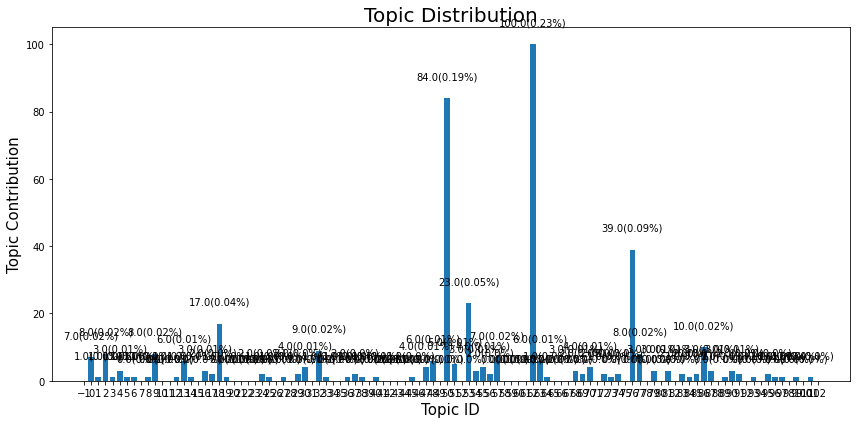

In [8]:
inference_body_eval1.get_model().topic_repartition()

In [9]:
inference_body_eval1.save("Saved Data")

In [8]:
inference_abstract_eval1_v2 = Inference('inference_abstract_eval1_v2', final_lda_abstract1_v2, abstract_eval1) 

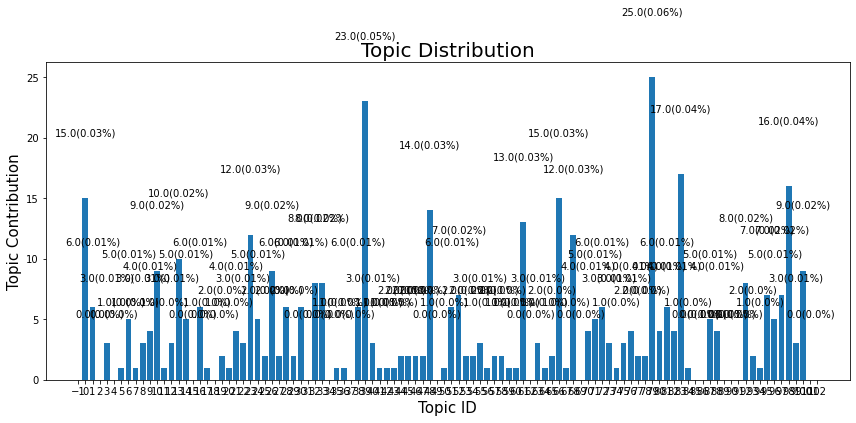

In [9]:
inference_abstract_eval1_v2.get_model().topic_repartition()

In [10]:
inference_abstract_eval1_v2.save("Saved Data")

### Start to run here

In [5]:
body_eval1 = Preprocessing1('body_eval1')
body_eval1.load('Saved Data/body_eval1.pickle')

abstract_eval1 = Preprocessing1('abstract_eval1')
abstract_eval1.load('Saved Data/abstract_eval1.pickle')

final_lda_body1 = LDAMallet("final_lda_body1", _)
final_lda_body1.load("Saved Data/final_lda_body1.pickle")

final_lda_abstract1_v2 = LDAMallet("final_lda_abstract1_v2", _)
final_lda_abstract1_v2.load("Saved Data/final_lda_abstract1_v2.pickle")

inference_body_eval1 = Inference('inference_body_eval1', final_lda_body1, body_eval1) 
inference_abstract_eval1_v3 = Inference('inference_abstract_eval1_v3', final_lda_abstract1_v2, abstract_eval1) 

### Defining tag list from the evaluation set

In [6]:
tag = [elem for liste in list(data_eval["Classification"]) for elem in liste]
tag = list(set(tag))

In [7]:
tag

['math.GN',
 'cs.AR',
 'math.AP',
 'cond-mat.mes-hall',
 'astro-ph.HE',
 'cs.CC',
 'math.AC',
 'eess.SP',
 'physics.optics',
 'cs.DB',
 'cs.CY',
 'cs.DM',
 'physics.chem-ph',
 'nlin.CG',
 'cs.HC',
 'math.CO',
 'q-bio.MN',
 'cs.PF',
 'cs.MS',
 'math.OC',
 'cs.DS',
 'physics.soc-ph',
 'math.AG',
 'q-bio.OT',
 'astro-ph.IM',
 'cs.CL',
 'cond-mat.mtrl-sci',
 'q-bio.CB',
 'q-bio.TO',
 'nlin.CD',
 'cs.NE',
 'cs.OH',
 'cs.CG',
 'cs.SI',
 'astro-ph.EP',
 'stat.AP',
 'q-bio.SC',
 'cond-mat.str-el',
 'gr-qc',
 'math-ph',
 'cs.ET',
 'math.FA',
 'nlin.PS',
 'cs.MM',
 'cs.RO',
 'math.CT',
 'astro-ph.SR',
 'cs.PL',
 'stat.ML',
 'q-bio.BM',
 'math.OA',
 'physics.plasm-ph',
 'math.NA',
 'eess.SY',
 'math.HO',
 'physics.comp-ph',
 'cs.FL',
 'cond-mat.other',
 'cs.LO',
 'stat.ME',
 'cs.LG',
 'eess.AS',
 'physics.ins-det',
 'q-bio.GN',
 'math.GT',
 'physics.bio-ph',
 'nucl-ex',
 'math.GR',
 'physics.med-ph',
 'math.AT',
 'cs.SD',
 'math.NT',
 'cs.DC',
 'physics.data-an',
 'cond-mat.soft',
 'hep-ex',
 'nu

### At this point, we will try two different ways to calculate similarity between two documents

### The list of avalaible measure

In [8]:
measures = ["JSD","cosine","chebyshev","L2","minkowski", "braycurtis", "canberra", "manhattan", "correlation"]

In [9]:
similarity = SimilarityV1V3('Similarity1_v1', final_lda_abstract1_v2, final_lda_body1, inference_abstract_eval1_v3, inference_body_eval1)

### Visualization of the similarity score distribution with a target document and the entire training set

In [17]:
similarity.most_similar_sorted(0, measures, 0.5)

[('oai:CiteSeerX.psu:10.1.1.1.3859', 1.0),
 ('oai:CiteSeerX.psu:10.1.1.1.6584', 0.9854913187508625),
 ('oai:CiteSeerX.psu:10.1.1.1.4592', 0.9757783151902137),
 ('oai:CiteSeerX.psu:10.1.1.1.4806', 0.9630807885785707),
 ('oai:CiteSeerX.psu:10.1.1.1.6471', 0.9601285589867112),
 ('oai:CiteSeerX.psu:10.1.1.1.4387', 0.9557019849029225),
 ('oai:CiteSeerX.psu:10.1.1.1.2463', 0.9551305991845719),
 ('oai:CiteSeerX.psu:10.1.1.1.2803', 0.9539052012533429),
 ('oai:CiteSeerX.psu:10.1.1.1.3616', 0.9480883600221583),
 ('oai:CiteSeerX.psu:10.1.1.1.6749', 0.9437037381439816),
 ('oai:CiteSeerX.psu:10.1.1.1.3149', 0.9432542516292406),
 ('oai:CiteSeerX.psu:10.1.1.1.3806', 0.932528256966586),
 ('oai:CiteSeerX.psu:10.1.1.1.5617', 0.9183573666656558),
 ('oai:CiteSeerX.psu:10.1.1.1.1535', 0.9175251754482119),
 ('oai:CiteSeerX.psu:10.1.1.1.4335', 0.9134497268601689),
 ('oai:CiteSeerX.psu:10.1.1.1.3853', 0.9122607502582867),
 ('oai:CiteSeerX.psu:10.1.1.1.4801', 0.9111440182280803),
 ('oai:CiteSeerX.psu:10.1.1.1.

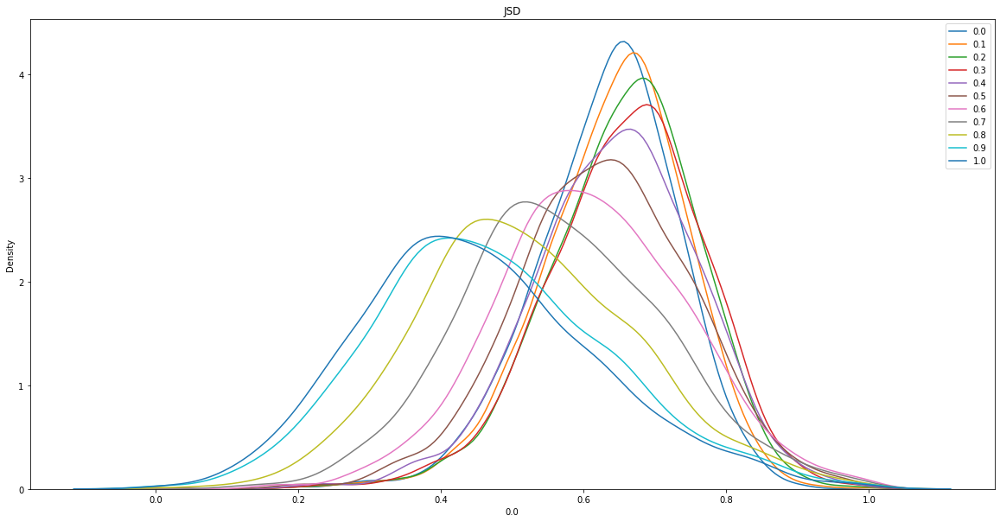

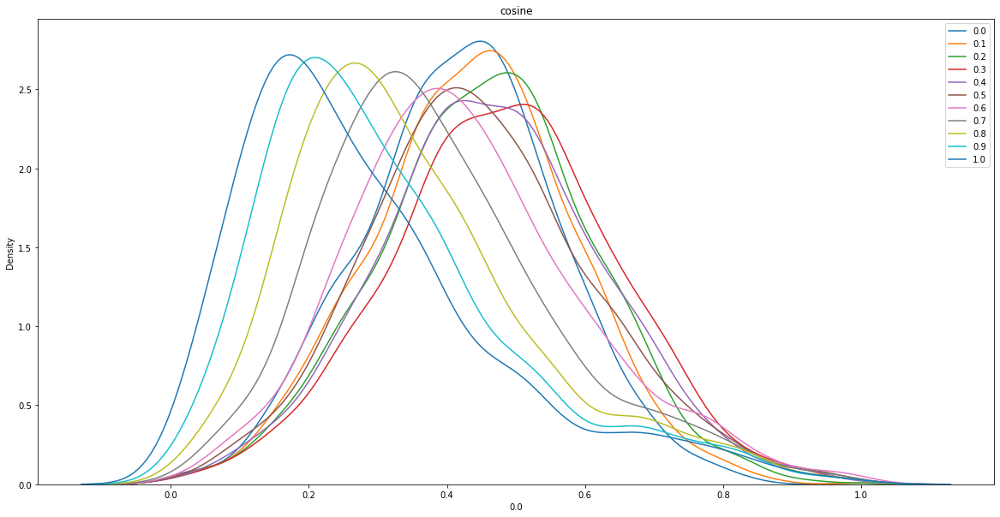

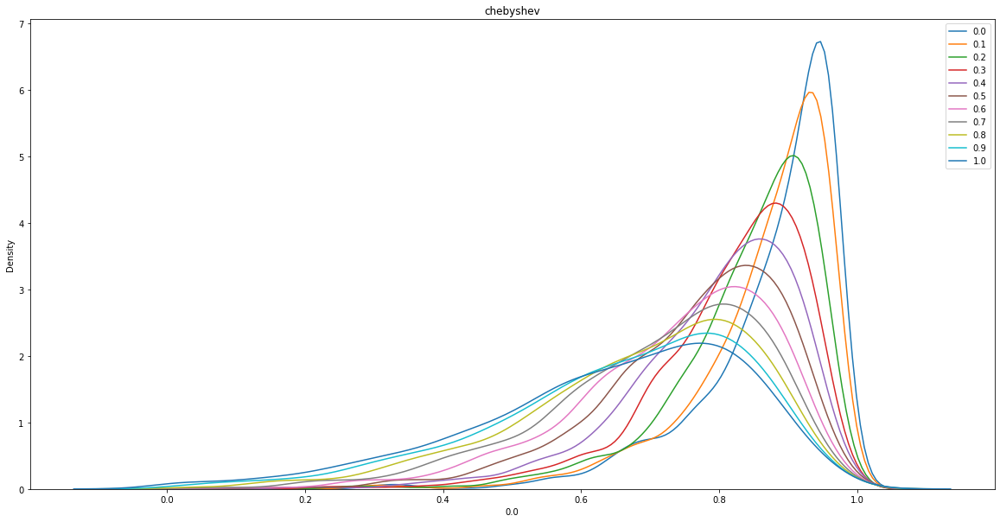

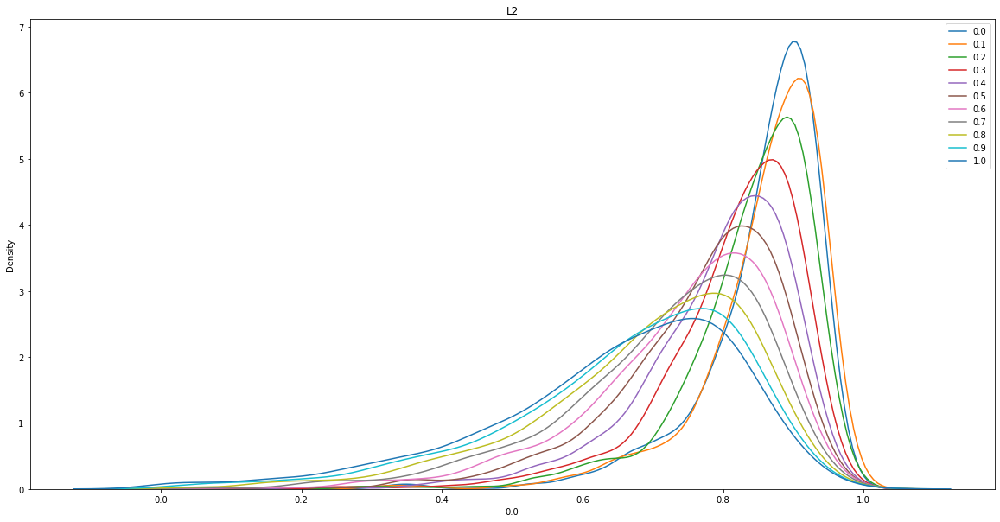

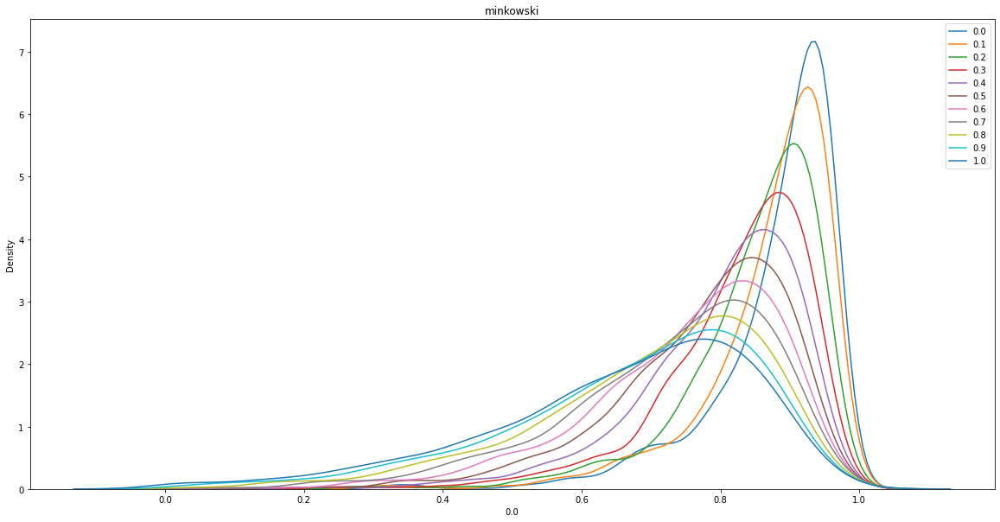

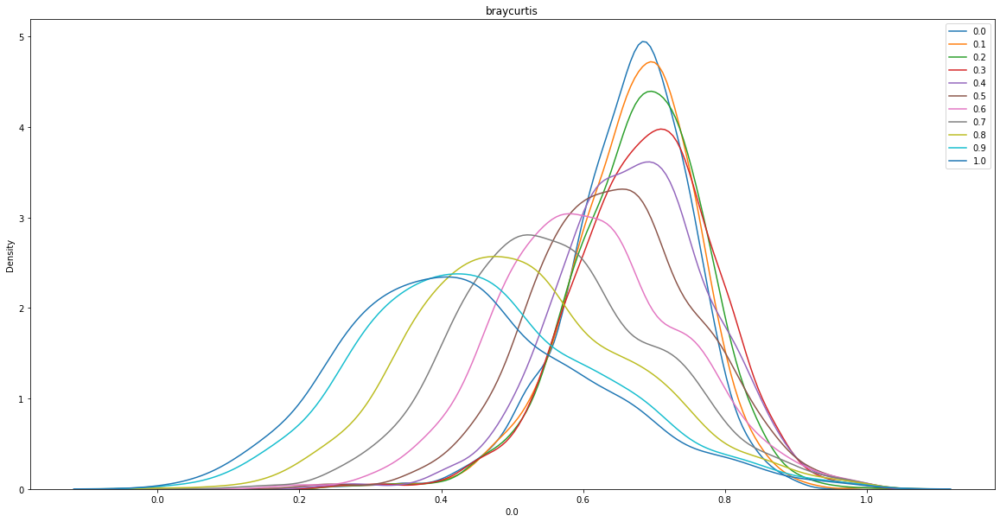

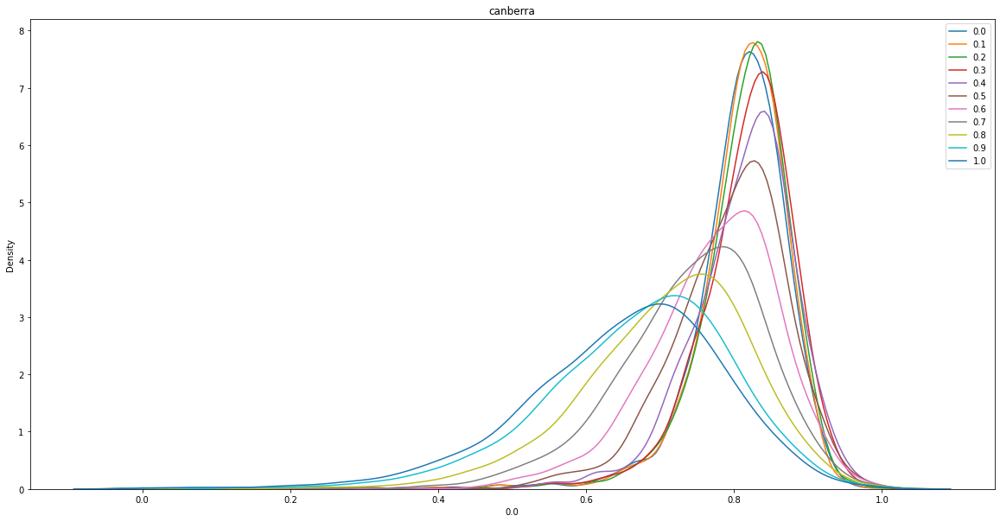

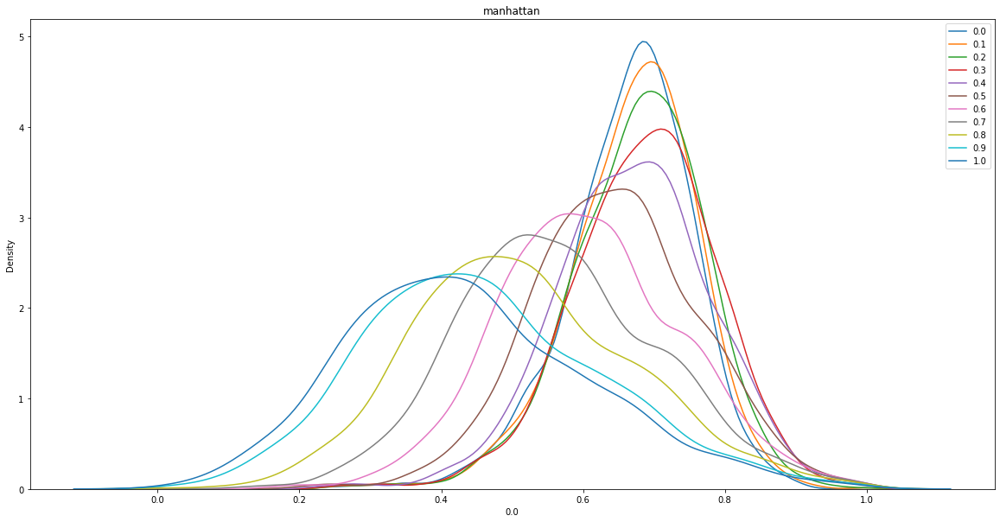

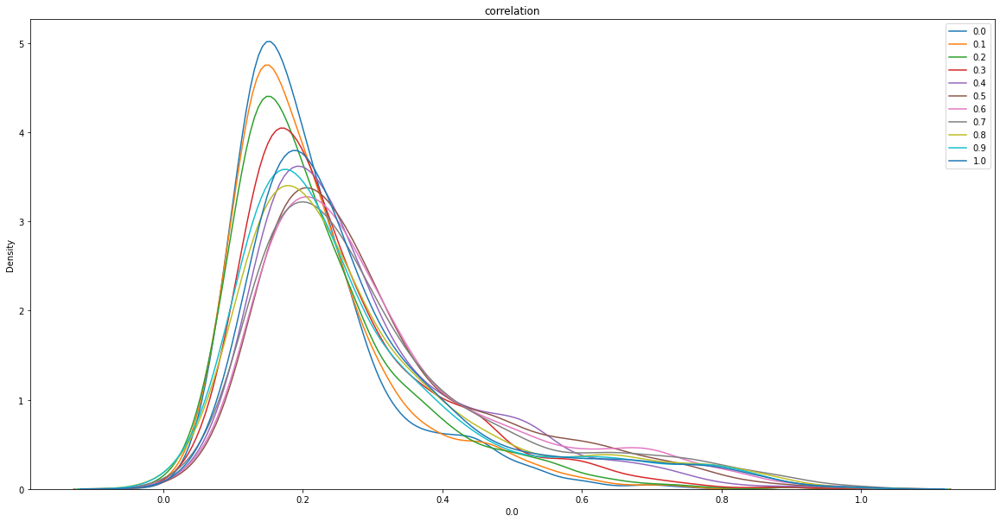

In [18]:
similarity.similarity_distribution(0, measures)

### Measure Normalisation

In [19]:
ms = {measure : [] for measure in measures}
for measure in measures:
    ms1 = similarity.most_similar_sorted(0, measure, 0.5)
    ms1 = np.array([m[1] for m in ms1])
    ms[measure] += list(ms1)

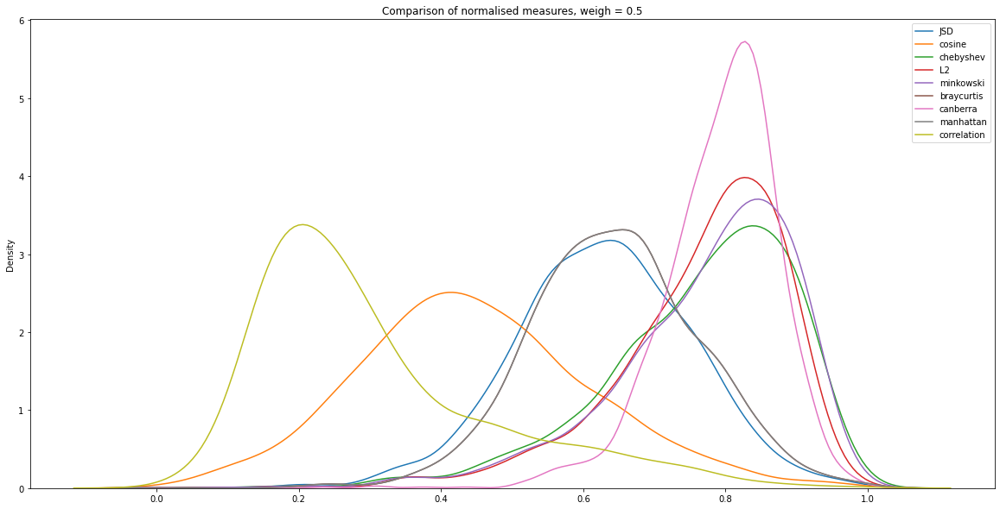

In [20]:
fig = plt.figure(1, figsize=(20, 10))
for measure in measures:
    sns.kdeplot(ms[measure], label=measure)
plt.legend() 
plt.title('Comparison of normalised measures, weigh = 0.5')
plt.show()

    We can make 5 groups
    We verify that we have superposition between Manhattan and Braycurtis curve, because they are the same on normalized data
    We will keep Manhattan

In [10]:
measures.remove('braycurtis')

### Shapiro test to see if the distribution is normal

In [22]:
for measure in measures:
    shapiro_test = stats.shapiro((ms[measure]-np.mean(ms[measure]))/np.std(ms[measure]))
    print(measure, shapiro_test)

JSD ShapiroResult(statistic=0.9956656098365784, pvalue=0.00017230965022463351)
cosine ShapiroResult(statistic=0.9942209720611572, pvalue=8.370359864784405e-06)
chebyshev ShapiroResult(statistic=0.9273169636726379, pvalue=5.8081582817107944e-27)
L2 ShapiroResult(statistic=0.9090995788574219, pvalue=1.1368565850192338e-29)
minkowski ShapiroResult(statistic=0.9118798971176147, pvalue=2.754588085423133e-29)
canberra ShapiroResult(statistic=0.9222555756568909, pvalue=9.188837098474996e-28)
manhattan ShapiroResult(statistic=0.9945868253707886, pvalue=1.7399552234564908e-05)
correlation ShapiroResult(statistic=0.8944131731987, pvalue=1.4638673302626216e-31)


In [23]:
# generate univariate observations
# normality test
for measure in measures:
    stat, p = shapiro((ms[measure]-np.mean(ms[measure]))/np.std(ms[measure]))
    print('Statistics=%.3f, p=%.3f' % (stat, p))
    # interpret
    alpha = 0.05
    if p > alpha:
        print('Sample looks Gaussian (fail to reject H0)')
    else:
        print('Sample does not look Gaussian (reject H0)')

Statistics=0.996, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.994, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.927, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.909, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.912, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.922, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.995, p=0.000
Sample does not look Gaussian (reject H0)
Statistics=0.894, p=0.000
Sample does not look Gaussian (reject H0)


/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


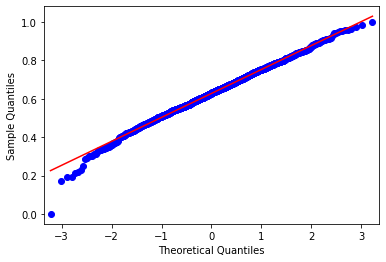

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


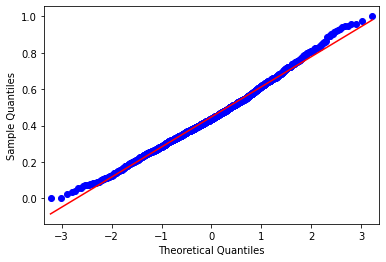

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


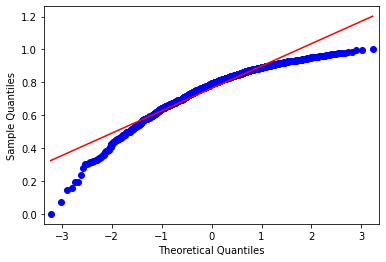

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


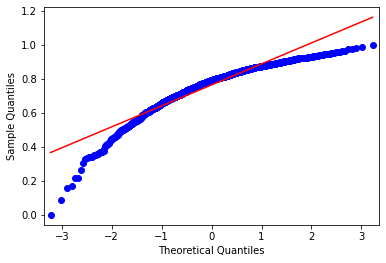

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


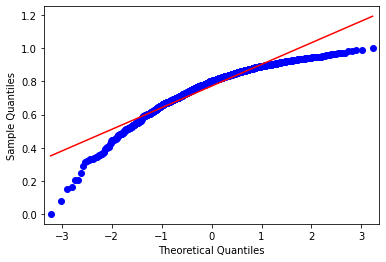

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


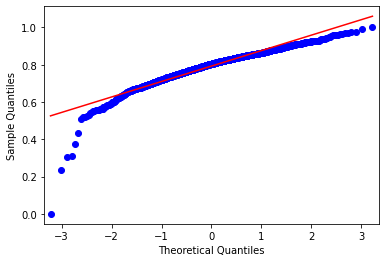

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


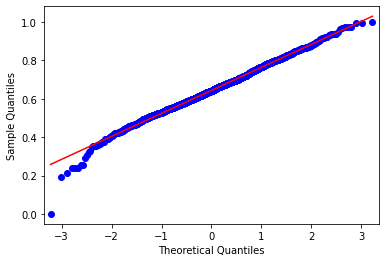

/home/stsapoui/Project/env/lib/python3.8/site-packages/statsmodels/graphics/gofplots.py:993: UserWarning: marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.
  ax.plot(x, y, fmt, **plot_style)


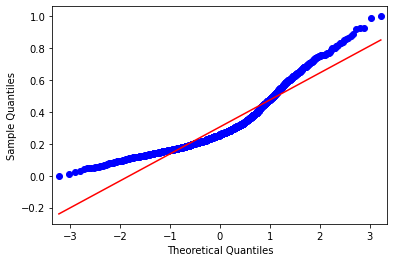

In [24]:
for measure in measures:
    qqplot(np.array(ms[measure]), line='s')
    pyplot.show()

In [25]:
weights ={measure : 0.5 for measure in measures}

In [26]:
matrix_prediction = similarity.same_prediction(weights)

step 1/431 : 0.7798430919647217sec
step 2/431 : 0.7718343734741211sec
step 3/431 : 0.7667720317840576sec
step 4/431 : 0.7683422565460205sec
step 5/431 : 0.7761938571929932sec
step 6/431 : 0.7713613510131836sec
step 7/431 : 0.8605968952178955sec
step 8/431 : 0.8570728302001953sec
step 9/431 : 0.8590850830078125sec
step 10/431 : 0.8166325092315674sec
step 11/431 : 0.7633798122406006sec
step 12/431 : 0.7849082946777344sec
step 13/431 : 0.771021842956543sec
step 14/431 : 0.7717423439025879sec
step 15/431 : 0.7711503505706787sec
step 16/431 : 0.7725906372070312sec
step 17/431 : 0.7797088623046875sec
step 18/431 : 0.7774331569671631sec
step 19/431 : 0.7651448249816895sec
step 20/431 : 0.7768902778625488sec
step 21/431 : 0.7668137550354004sec
step 22/431 : 0.7775721549987793sec
step 23/431 : 0.7654926776885986sec
step 24/431 : 0.765369176864624sec
step 25/431 : 0.7677092552185059sec
step 26/431 : 0.7715244293212891sec
step 27/431 : 0.7685472965240479sec
step 28/431 : 0.7735013961791992sec
ste

step 227/431 : 0.7694098949432373sec
step 228/431 : 0.83559250831604sec
step 229/431 : 0.7827377319335938sec
step 230/431 : 0.7649731636047363sec
step 231/431 : 0.76857590675354sec
step 232/431 : 0.7680294513702393sec
step 233/431 : 0.7682657241821289sec
step 234/431 : 0.7670972347259521sec
step 235/431 : 0.7641677856445312sec
step 236/431 : 0.7703123092651367sec
step 237/431 : 0.7755966186523438sec
step 238/431 : 0.7709386348724365sec
step 239/431 : 0.7886896133422852sec
step 240/431 : 0.7593297958374023sec
step 241/431 : 0.7665145397186279sec
step 242/431 : 0.7628800868988037sec
step 243/431 : 0.7689268589019775sec
step 244/431 : 0.762537956237793sec
step 245/431 : 0.7657146453857422sec
step 246/431 : 0.7708065509796143sec
step 247/431 : 0.7866199016571045sec
step 248/431 : 0.7679271697998047sec
step 249/431 : 0.7666475772857666sec
step 250/431 : 0.7720577716827393sec
step 251/431 : 0.779200553894043sec
step 252/431 : 0.7684426307678223sec
step 253/431 : 0.7659702301025391sec
step 25

In [27]:
matrix_prediction

,JSD,cosine,chebyshev,L2,minkowski,canberra,manhattan,correlation
JSD,0,96682368,221736160,187578712,209232318,223870210,52857476,211356012
cosine,96682368,0,199540508,176953728,192197422,269249062,129160762,204743954
chebyshev,221736160,199540508,0,73202784,46907230,331031320,240352082,333410542
L2,187578712,176953728,73202784,0,32311842,321276470,205909510,313356046
minkowski,209232318,192197422,46907230,32311842,0,330181108,227953430,327128042
canberra,223870210,269249062,331031320,321276470,330181108,0,203651940,276160126
manhattan,52857476,129160762,240352082,205909510,227953430,203651940,0,215366574
correlation,211356012,204743954,333410542,313356046,327128042,276160126,215366574,0


In [28]:
(1-matrix_prediction/matrix_prediction.max().max()).style.background_gradient(cmap='Reds')

,JSD,cosine,chebyshev,L2,minkowski,canberra,manhattan,correlation
JSD,1.000000,0.710020,0.334946,0.437394,0.372448,0.328545,0.841464,0.366079
cosine,0.710020,1.000000,0.401517,0.469262,0.423541,0.192440,0.612607,0.385910
chebyshev,0.334946,0.401517,1.000000,0.780443,0.859311,0.007136,0.279111,0.000000
L2,0.437394,0.469262,0.780443,1.000000,0.903087,0.036394,0.382415,0.060150
minkowski,0.372448,0.423541,0.859311,0.903087,1.000000,0.009686,0.316298,0.018843
canberra,0.328545,0.192440,0.007136,0.036394,0.009686,1.000000,0.389186,0.171711
manhattan,0.841464,0.612607,0.279111,0.382415,0.316298,0.389186,1.000000,0.354050
correlation,0.366079,0.385910,0.000000,0.060150,0.018843,0.171711,0.354050,1.000000


In [29]:
(1-matrix_prediction).style.background_gradient(cmap='Reds')

,JSD,cosine,chebyshev,L2,minkowski,canberra,manhattan,correlation
JSD,1,-96682367,-221736159,-187578711,-209232317,-223870209,-52857475,-211356011
cosine,-96682367,1,-199540507,-176953727,-192197421,-269249061,-129160761,-204743953
chebyshev,-221736159,-199540507,1,-73202783,-46907229,-331031319,-240352081,-333410541
L2,-187578711,-176953727,-73202783,1,-32311841,-321276469,-205909509,-313356045
minkowski,-209232317,-192197421,-46907229,-32311841,1,-330181107,-227953429,-327128041
canberra,-223870209,-269249061,-331031319,-321276469,-330181107,1,-203651939,-276160125
manhattan,-52857475,-129160761,-240352081,-205909509,-227953429,-203651939,1,-215366573
correlation,-211356011,-204743953,-333410541,-313356045,-327128041,-276160125,-215366573,1


### Evaluation of performance

In [30]:
field, tag = similarity.evaluation(data_eval, measures)

In [31]:
classified_field_pie = {measure : [] for measure in measures}
classified_tag_pie = {measure : [] for measure in measures}
for f, t, measure in zip(field.values(), tag.values(), measures):
    print(measure)
    for weight in np.linspace(0,1,11):
        sub_field = f[f["Weight"]==weight]
        sub_tag = t[t["Weight"]==weight]
        display(sub_field.style.background_gradient(cmap="Reds"))
        display(sub_tag.style.background_gradient(cmap="Reds"))
        classified_field_pie[measure].append([sub_field['Well classified field'].sum(axis=0),sub_field['Badly classified field'].sum(axis=0)])
        classified_tag_pie[measure].append([sub_tag['Well classified tag'].sum(axis=0),sub_tag['Badly classified tag'].sum(axis=0)])

JSD


,Well classified field,Badly classified field,Weight
math,0.769912,0.230088,0.000000
physic,0.433333,0.566667,0.000000
biologie,0.432692,0.567308,0.000000
computer,0.574468,0.425532,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.415929,0.584071,0.000000
physic,0.125000,0.875000,0.000000
biologie,0.250000,0.750000,0.000000
computer,0.191489,0.808511,0.000000


,Well classified field,Badly classified field,Weight
math,0.920354,0.079646,0.100000
physic,0.925000,0.075000,0.100000
biologie,0.596154,0.403846,0.100000
computer,0.627660,0.372340,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.539823,0.460177,0.100000
physic,0.383333,0.616667,0.100000
biologie,0.423077,0.576923,0.100000
computer,0.234043,0.765957,0.100000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.200000
physic,0.941667,0.058333,0.200000
biologie,0.644231,0.355769,0.200000
computer,0.648936,0.351064,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.200000
physic,0.416667,0.583333,0.200000
biologie,0.413462,0.586538,0.200000
computer,0.255319,0.744681,0.200000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.300000
physic,0.966667,0.033333,0.300000
biologie,0.673077,0.326923,0.300000
computer,0.702128,0.297872,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.601770,0.398230,0.300000
physic,0.458333,0.541667,0.300000
biologie,0.480769,0.519231,0.300000
computer,0.351064,0.648936,0.300000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.400000
physic,0.966667,0.033333,0.400000
biologie,0.711538,0.288462,0.400000
computer,0.755319,0.244681,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.400000
physic,0.458333,0.541667,0.400000
biologie,0.548077,0.451923,0.400000
computer,0.382979,0.617021,0.400000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.500000
physic,0.950000,0.050000,0.500000
biologie,0.769231,0.230769,0.500000
computer,0.787234,0.212766,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.699115,0.300885,0.500000
physic,0.441667,0.558333,0.500000
biologie,0.615385,0.384615,0.500000
computer,0.436170,0.563830,0.500000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.600000
physic,0.958333,0.041667,0.600000
biologie,0.807692,0.192308,0.600000
computer,0.808511,0.191489,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.716814,0.283186,0.600000
physic,0.458333,0.541667,0.600000
biologie,0.634615,0.365385,0.600000
computer,0.446809,0.553191,0.600000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.700000
physic,0.966667,0.033333,0.700000
biologie,0.836538,0.163462,0.700000
computer,0.829787,0.170213,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.716814,0.283186,0.700000
physic,0.458333,0.541667,0.700000
biologie,0.644231,0.355769,0.700000
computer,0.489362,0.510638,0.700000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.800000
physic,0.958333,0.041667,0.800000
biologie,0.865385,0.134615,0.800000
computer,0.829787,0.170213,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.734513,0.265487,0.800000
physic,0.450000,0.550000,0.800000
biologie,0.682692,0.317308,0.800000
computer,0.521277,0.478723,0.800000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.900000
physic,0.958333,0.041667,0.900000
biologie,0.865385,0.134615,0.900000
computer,0.829787,0.170213,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.725664,0.274336,0.900000
physic,0.466667,0.533333,0.900000
biologie,0.663462,0.336538,0.900000
computer,0.500000,0.500000,0.900000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,1.000000
physic,0.950000,0.050000,1.000000
biologie,0.865385,0.134615,1.000000
computer,0.829787,0.170213,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.707965,0.292035,1.000000
physic,0.466667,0.533333,1.000000
biologie,0.682692,0.317308,1.000000
computer,0.489362,0.510638,1.000000


cosine


,Well classified field,Badly classified field,Weight
math,0.840708,0.159292,0.000000
physic,0.483333,0.516667,0.000000
biologie,0.471154,0.528846,0.000000
computer,0.542553,0.457447,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.477876,0.522124,0.000000
physic,0.133333,0.866667,0.000000
biologie,0.346154,0.653846,0.000000
computer,0.255319,0.744681,0.000000


,Well classified field,Badly classified field,Weight
math,0.964602,0.035398,0.100000
physic,0.925000,0.075000,0.100000
biologie,0.605769,0.394231,0.100000
computer,0.574468,0.425532,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.486726,0.513274,0.100000
physic,0.350000,0.650000,0.100000
biologie,0.461538,0.538462,0.100000
computer,0.308511,0.691489,0.100000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.200000
physic,0.925000,0.075000,0.200000
biologie,0.673077,0.326923,0.200000
computer,0.638298,0.361702,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.513274,0.486726,0.200000
physic,0.383333,0.616667,0.200000
biologie,0.461538,0.538462,0.200000
computer,0.372340,0.627660,0.200000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.300000
physic,0.941667,0.058333,0.300000
biologie,0.730769,0.269231,0.300000
computer,0.734043,0.265957,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.557522,0.442478,0.300000
physic,0.375000,0.625000,0.300000
biologie,0.538462,0.461538,0.300000
computer,0.457447,0.542553,0.300000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.400000
physic,0.933333,0.066667,0.400000
biologie,0.740385,0.259615,0.400000
computer,0.808511,0.191489,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.400000
physic,0.416667,0.583333,0.400000
biologie,0.538462,0.461538,0.400000
computer,0.457447,0.542553,0.400000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.500000
physic,0.933333,0.066667,0.500000
biologie,0.750000,0.250000,0.500000
computer,0.840426,0.159574,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.500000
physic,0.416667,0.583333,0.500000
biologie,0.548077,0.451923,0.500000
computer,0.478723,0.521277,0.500000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.600000
physic,0.933333,0.066667,0.600000
biologie,0.740385,0.259615,0.600000
computer,0.829787,0.170213,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.548673,0.451327,0.600000
physic,0.425000,0.575000,0.600000
biologie,0.538462,0.461538,0.600000
computer,0.468085,0.531915,0.600000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.700000
physic,0.933333,0.066667,0.700000
biologie,0.798077,0.201923,0.700000
computer,0.861702,0.138298,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.522124,0.477876,0.700000
physic,0.416667,0.583333,0.700000
biologie,0.605769,0.394231,0.700000
computer,0.489362,0.510638,0.700000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.800000
physic,0.941667,0.058333,0.800000
biologie,0.778846,0.221154,0.800000
computer,0.882979,0.117021,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.800000
physic,0.400000,0.600000,0.800000
biologie,0.596154,0.403846,0.800000
computer,0.489362,0.510638,0.800000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.900000
physic,0.941667,0.058333,0.900000
biologie,0.788462,0.211538,0.900000
computer,0.872340,0.127660,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.900000
physic,0.358333,0.641667,0.900000
biologie,0.615385,0.384615,0.900000
computer,0.468085,0.531915,0.900000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,1.000000
physic,0.925000,0.075000,1.000000
biologie,0.798077,0.201923,1.000000
computer,0.861702,0.138298,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.646018,0.353982,1.000000
physic,0.375000,0.625000,1.000000
biologie,0.615385,0.384615,1.000000
computer,0.468085,0.531915,1.000000


chebyshev


,Well classified field,Badly classified field,Weight
math,0.734513,0.265487,0.000000
physic,0.600000,0.400000,0.000000
biologie,0.413462,0.586538,0.000000
computer,0.404255,0.595745,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.407080,0.592920,0.000000
physic,0.175000,0.825000,0.000000
biologie,0.317308,0.682692,0.000000
computer,0.191489,0.808511,0.000000


,Well classified field,Badly classified field,Weight
math,0.938053,0.061947,0.100000
physic,0.875000,0.125000,0.100000
biologie,0.644231,0.355769,0.100000
computer,0.617021,0.382979,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.100000
physic,0.308333,0.691667,0.100000
biologie,0.432692,0.567308,0.100000
computer,0.319149,0.680851,0.100000


,Well classified field,Badly classified field,Weight
math,0.964602,0.035398,0.200000
physic,0.900000,0.100000,0.200000
biologie,0.663462,0.336538,0.200000
computer,0.691489,0.308511,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,0.200000
physic,0.316667,0.683333,0.200000
biologie,0.471154,0.528846,0.200000
computer,0.404255,0.595745,0.200000


,Well classified field,Badly classified field,Weight
math,0.964602,0.035398,0.300000
physic,0.900000,0.100000,0.300000
biologie,0.682692,0.317308,0.300000
computer,0.734043,0.265957,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,0.300000
physic,0.341667,0.658333,0.300000
biologie,0.480769,0.519231,0.300000
computer,0.425532,0.574468,0.300000


,Well classified field,Badly classified field,Weight
math,0.973451,0.026549,0.400000
physic,0.900000,0.100000,0.400000
biologie,0.740385,0.259615,0.400000
computer,0.734043,0.265957,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.557522,0.442478,0.400000
physic,0.408333,0.591667,0.400000
biologie,0.519231,0.480769,0.400000
computer,0.414894,0.585106,0.400000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.500000
physic,0.858333,0.141667,0.500000
biologie,0.740385,0.259615,0.500000
computer,0.723404,0.276596,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.548673,0.451327,0.500000
physic,0.408333,0.591667,0.500000
biologie,0.519231,0.480769,0.500000
computer,0.404255,0.595745,0.500000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.600000
physic,0.850000,0.150000,0.600000
biologie,0.759615,0.240385,0.600000
computer,0.755319,0.244681,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.557522,0.442478,0.600000
physic,0.358333,0.641667,0.600000
biologie,0.528846,0.471154,0.600000
computer,0.414894,0.585106,0.600000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.700000
physic,0.850000,0.150000,0.700000
biologie,0.759615,0.240385,0.700000
computer,0.765957,0.234043,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.700000
physic,0.350000,0.650000,0.700000
biologie,0.528846,0.471154,0.700000
computer,0.414894,0.585106,0.700000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.800000
physic,0.841667,0.158333,0.800000
biologie,0.778846,0.221154,0.800000
computer,0.755319,0.244681,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,0.800000
physic,0.333333,0.666667,0.800000
biologie,0.509615,0.490385,0.800000
computer,0.404255,0.595745,0.800000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.900000
physic,0.866667,0.133333,0.900000
biologie,0.778846,0.221154,0.900000
computer,0.765957,0.234043,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.900000
physic,0.333333,0.666667,0.900000
biologie,0.528846,0.471154,0.900000
computer,0.414894,0.585106,0.900000


,Well classified field,Badly classified field,Weight
math,0.973451,0.026549,1.000000
physic,0.866667,0.133333,1.000000
biologie,0.759615,0.240385,1.000000
computer,0.765957,0.234043,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.584071,0.415929,1.000000
physic,0.325000,0.675000,1.000000
biologie,0.538462,0.461538,1.000000
computer,0.457447,0.542553,1.000000


L2


,Well classified field,Badly classified field,Weight
math,0.778761,0.221239,0.000000
physic,0.483333,0.516667,0.000000
biologie,0.394231,0.605769,0.000000
computer,0.595745,0.404255,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.433628,0.566372,0.000000
physic,0.141667,0.858333,0.000000
biologie,0.240385,0.759615,0.000000
computer,0.234043,0.765957,0.000000


,Well classified field,Badly classified field,Weight
math,0.955752,0.044248,0.100000
physic,0.925000,0.075000,0.100000
biologie,0.605769,0.394231,0.100000
computer,0.563830,0.436170,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.539823,0.460177,0.100000
physic,0.358333,0.641667,0.100000
biologie,0.413462,0.586538,0.100000
computer,0.308511,0.691489,0.100000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.200000
physic,0.925000,0.075000,0.200000
biologie,0.711538,0.288462,0.200000
computer,0.659574,0.340426,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.200000
physic,0.383333,0.616667,0.200000
biologie,0.480769,0.519231,0.200000
computer,0.340426,0.659574,0.200000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.300000
physic,0.925000,0.075000,0.300000
biologie,0.750000,0.250000,0.300000
computer,0.627660,0.372340,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.584071,0.415929,0.300000
physic,0.391667,0.608333,0.300000
biologie,0.548077,0.451923,0.300000
computer,0.361702,0.638298,0.300000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.400000
physic,0.933333,0.066667,0.400000
biologie,0.788462,0.211538,0.400000
computer,0.606383,0.393617,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.601770,0.398230,0.400000
physic,0.416667,0.583333,0.400000
biologie,0.615385,0.384615,0.400000
computer,0.361702,0.638298,0.400000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.500000
physic,0.916667,0.083333,0.500000
biologie,0.817308,0.182692,0.500000
computer,0.617021,0.382979,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.500000
physic,0.408333,0.591667,0.500000
biologie,0.644231,0.355769,0.500000
computer,0.351064,0.648936,0.500000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.600000
physic,0.908333,0.091667,0.600000
biologie,0.836538,0.163462,0.600000
computer,0.670213,0.329787,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.600000
physic,0.425000,0.575000,0.600000
biologie,0.663462,0.336538,0.600000
computer,0.361702,0.638298,0.600000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.700000
physic,0.916667,0.083333,0.700000
biologie,0.826923,0.173077,0.700000
computer,0.723404,0.276596,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.700000
physic,0.383333,0.616667,0.700000
biologie,0.634615,0.365385,0.700000
computer,0.382979,0.617021,0.700000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.800000
physic,0.908333,0.091667,0.800000
biologie,0.836538,0.163462,0.800000
computer,0.723404,0.276596,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.654867,0.345133,0.800000
physic,0.350000,0.650000,0.800000
biologie,0.615385,0.384615,0.800000
computer,0.404255,0.595745,0.800000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.900000
physic,0.908333,0.091667,0.900000
biologie,0.836538,0.163462,0.900000
computer,0.776596,0.223404,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.663717,0.336283,0.900000
physic,0.366667,0.633333,0.900000
biologie,0.615385,0.384615,0.900000
computer,0.393617,0.606383,0.900000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,1.000000
physic,0.908333,0.091667,1.000000
biologie,0.855769,0.144231,1.000000
computer,0.755319,0.244681,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.646018,0.353982,1.000000
physic,0.383333,0.616667,1.000000
biologie,0.644231,0.355769,1.000000
computer,0.393617,0.606383,1.000000


minkowski


,Well classified field,Badly classified field,Weight
math,0.814159,0.185841,0.000000
physic,0.500000,0.500000,0.000000
biologie,0.432692,0.567308,0.000000
computer,0.436170,0.563830,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.442478,0.557522,0.000000
physic,0.166667,0.833333,0.000000
biologie,0.307692,0.692308,0.000000
computer,0.191489,0.808511,0.000000


,Well classified field,Badly classified field,Weight
math,0.964602,0.035398,0.100000
physic,0.925000,0.075000,0.100000
biologie,0.663462,0.336538,0.100000
computer,0.563830,0.436170,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.548673,0.451327,0.100000
physic,0.350000,0.650000,0.100000
biologie,0.480769,0.519231,0.100000
computer,0.340426,0.659574,0.100000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.200000
physic,0.916667,0.083333,0.200000
biologie,0.701923,0.298077,0.200000
computer,0.712766,0.287234,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.200000
physic,0.375000,0.625000,0.200000
biologie,0.490385,0.509615,0.200000
computer,0.404255,0.595745,0.200000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.300000
physic,0.933333,0.066667,0.300000
biologie,0.701923,0.298077,0.300000
computer,0.680851,0.319149,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.300000
physic,0.375000,0.625000,0.300000
biologie,0.519231,0.480769,0.300000
computer,0.404255,0.595745,0.300000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.400000
physic,0.925000,0.075000,0.400000
biologie,0.750000,0.250000,0.400000
computer,0.648936,0.351064,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.400000
physic,0.391667,0.608333,0.400000
biologie,0.557692,0.442308,0.400000
computer,0.382979,0.617021,0.400000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.500000
physic,0.916667,0.083333,0.500000
biologie,0.788462,0.211538,0.500000
computer,0.744681,0.255319,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.500000
physic,0.408333,0.591667,0.500000
biologie,0.615385,0.384615,0.500000
computer,0.393617,0.606383,0.500000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.600000
physic,0.891667,0.108333,0.600000
biologie,0.798077,0.201923,0.600000
computer,0.744681,0.255319,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.584071,0.415929,0.600000
physic,0.391667,0.608333,0.600000
biologie,0.634615,0.365385,0.600000
computer,0.382979,0.617021,0.600000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.700000
physic,0.891667,0.108333,0.700000
biologie,0.807692,0.192308,0.700000
computer,0.765957,0.234043,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,0.700000
physic,0.383333,0.616667,0.700000
biologie,0.625000,0.375000,0.700000
computer,0.425532,0.574468,0.700000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.800000
physic,0.883333,0.116667,0.800000
biologie,0.826923,0.173077,0.800000
computer,0.755319,0.244681,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.628319,0.371681,0.800000
physic,0.358333,0.641667,0.800000
biologie,0.576923,0.423077,0.800000
computer,0.436170,0.563830,0.800000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.900000
physic,0.891667,0.108333,0.900000
biologie,0.826923,0.173077,0.900000
computer,0.765957,0.234043,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,0.900000
physic,0.358333,0.641667,0.900000
biologie,0.576923,0.423077,0.900000
computer,0.436170,0.563830,0.900000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,1.000000
physic,0.883333,0.116667,1.000000
biologie,0.826923,0.173077,1.000000
computer,0.765957,0.234043,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,1.000000
physic,0.358333,0.641667,1.000000
biologie,0.567308,0.432692,1.000000
computer,0.436170,0.563830,1.000000


canberra


,Well classified field,Badly classified field,Weight
math,0.946903,0.053097,0.000000
physic,0.516667,0.483333,0.000000
biologie,0.403846,0.596154,0.000000
computer,0.436170,0.563830,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.000000
physic,0.158333,0.841667,0.000000
biologie,0.269231,0.730769,0.000000
computer,0.234043,0.765957,0.000000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.100000
physic,0.700000,0.300000,0.100000
biologie,0.451923,0.548077,0.100000
computer,0.468085,0.531915,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.637168,0.362832,0.100000
physic,0.216667,0.783333,0.100000
biologie,0.250000,0.750000,0.100000
computer,0.223404,0.776596,0.100000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.200000
physic,0.766667,0.233333,0.200000
biologie,0.528846,0.471154,0.200000
computer,0.542553,0.457447,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.663717,0.336283,0.200000
physic,0.266667,0.733333,0.200000
biologie,0.278846,0.721154,0.200000
computer,0.265957,0.734043,0.200000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.300000
physic,0.833333,0.166667,0.300000
biologie,0.519231,0.480769,0.300000
computer,0.574468,0.425532,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.646018,0.353982,0.300000
physic,0.341667,0.658333,0.300000
biologie,0.307692,0.692308,0.300000
computer,0.265957,0.734043,0.300000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.400000
physic,0.858333,0.141667,0.400000
biologie,0.538462,0.461538,0.400000
computer,0.574468,0.425532,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.707965,0.292035,0.400000
physic,0.366667,0.633333,0.400000
biologie,0.317308,0.682692,0.400000
computer,0.255319,0.744681,0.400000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.500000
physic,0.883333,0.116667,0.500000
biologie,0.538462,0.461538,0.500000
computer,0.553191,0.446809,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.663717,0.336283,0.500000
physic,0.366667,0.633333,0.500000
biologie,0.326923,0.673077,0.500000
computer,0.244681,0.755319,0.500000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.600000
physic,0.875000,0.125000,0.600000
biologie,0.567308,0.432692,0.600000
computer,0.531915,0.468085,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.628319,0.371681,0.600000
physic,0.375000,0.625000,0.600000
biologie,0.375000,0.625000,0.600000
computer,0.244681,0.755319,0.600000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.700000
physic,0.875000,0.125000,0.700000
biologie,0.576923,0.423077,0.700000
computer,0.531915,0.468085,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.601770,0.398230,0.700000
physic,0.408333,0.591667,0.700000
biologie,0.413462,0.586538,0.700000
computer,0.265957,0.734043,0.700000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.800000
physic,0.875000,0.125000,0.800000
biologie,0.586538,0.413462,0.800000
computer,0.553191,0.446809,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,0.800000
physic,0.383333,0.616667,0.800000
biologie,0.413462,0.586538,0.800000
computer,0.265957,0.734043,0.800000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.900000
physic,0.875000,0.125000,0.900000
biologie,0.586538,0.413462,0.900000
computer,0.553191,0.446809,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.637168,0.362832,0.900000
physic,0.391667,0.608333,0.900000
biologie,0.432692,0.567308,0.900000
computer,0.276596,0.723404,0.900000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,1.000000
physic,0.866667,0.133333,1.000000
biologie,0.586538,0.413462,1.000000
computer,0.542553,0.457447,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.628319,0.371681,1.000000
physic,0.391667,0.608333,1.000000
biologie,0.432692,0.567308,1.000000
computer,0.276596,0.723404,1.000000


manhattan


,Well classified field,Badly classified field,Weight
math,0.893805,0.106195,0.000000
physic,0.475000,0.525000,0.000000
biologie,0.461538,0.538462,0.000000
computer,0.446809,0.553191,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.469027,0.530973,0.000000
physic,0.158333,0.841667,0.000000
biologie,0.326923,0.673077,0.000000
computer,0.234043,0.765957,0.000000


,Well classified field,Badly classified field,Weight
math,0.982301,0.017699,0.100000
physic,0.925000,0.075000,0.100000
biologie,0.605769,0.394231,0.100000
computer,0.595745,0.404255,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.592920,0.407080,0.100000
physic,0.366667,0.633333,0.100000
biologie,0.423077,0.576923,0.100000
computer,0.297872,0.702128,0.100000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.200000
physic,0.950000,0.050000,0.200000
biologie,0.711538,0.288462,0.200000
computer,0.712766,0.287234,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.663717,0.336283,0.200000
physic,0.408333,0.591667,0.200000
biologie,0.500000,0.500000,0.200000
computer,0.361702,0.638298,0.200000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.300000
physic,0.941667,0.058333,0.300000
biologie,0.740385,0.259615,0.300000
computer,0.723404,0.276596,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.628319,0.371681,0.300000
physic,0.441667,0.558333,0.300000
biologie,0.519231,0.480769,0.300000
computer,0.382979,0.617021,0.300000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.400000
physic,0.933333,0.066667,0.400000
biologie,0.778846,0.221154,0.400000
computer,0.744681,0.255319,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.548673,0.451327,0.400000
physic,0.433333,0.566667,0.400000
biologie,0.567308,0.432692,0.400000
computer,0.414894,0.585106,0.400000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.500000
physic,0.941667,0.058333,0.500000
biologie,0.778846,0.221154,0.500000
computer,0.797872,0.202128,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.500000
physic,0.425000,0.575000,0.500000
biologie,0.596154,0.403846,0.500000
computer,0.436170,0.563830,0.500000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.600000
physic,0.950000,0.050000,0.600000
biologie,0.788462,0.211538,0.600000
computer,0.819149,0.180851,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.600000
physic,0.408333,0.591667,0.600000
biologie,0.605769,0.394231,0.600000
computer,0.478723,0.521277,0.600000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.700000
physic,0.950000,0.050000,0.700000
biologie,0.836538,0.163462,0.700000
computer,0.829787,0.170213,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.663717,0.336283,0.700000
physic,0.433333,0.566667,0.700000
biologie,0.644231,0.355769,0.700000
computer,0.468085,0.531915,0.700000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.800000
physic,0.950000,0.050000,0.800000
biologie,0.836538,0.163462,0.800000
computer,0.840426,0.159574,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.681416,0.318584,0.800000
physic,0.441667,0.558333,0.800000
biologie,0.644231,0.355769,0.800000
computer,0.478723,0.521277,0.800000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.900000
physic,0.941667,0.058333,0.900000
biologie,0.826923,0.173077,0.900000
computer,0.840426,0.159574,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.663717,0.336283,0.900000
physic,0.441667,0.558333,0.900000
biologie,0.634615,0.365385,0.900000
computer,0.478723,0.521277,0.900000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,1.000000
physic,0.933333,0.066667,1.000000
biologie,0.826923,0.173077,1.000000
computer,0.840426,0.159574,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.654867,0.345133,1.000000
physic,0.458333,0.541667,1.000000
biologie,0.634615,0.365385,1.000000
computer,0.489362,0.510638,1.000000


correlation


,Well classified field,Badly classified field,Weight
math,0.867257,0.132743,0.000000
physic,0.575000,0.425000,0.000000
biologie,0.548077,0.451923,0.000000
computer,0.553191,0.446809,0.000000


,Well classified tag,Badly classified tag,Weight
math,0.495575,0.504425,0.000000
physic,0.191667,0.808333,0.000000
biologie,0.384615,0.615385,0.000000
computer,0.276596,0.723404,0.000000


,Well classified field,Badly classified field,Weight
math,0.929204,0.070796,0.100000
physic,0.733333,0.266667,0.100000
biologie,0.615385,0.384615,0.100000
computer,0.585106,0.414894,0.100000


,Well classified tag,Badly classified tag,Weight
math,0.557522,0.442478,0.100000
physic,0.241667,0.758333,0.100000
biologie,0.432692,0.567308,0.100000
computer,0.340426,0.659574,0.100000


,Well classified field,Badly classified field,Weight
math,0.955752,0.044248,0.200000
physic,0.883333,0.116667,0.200000
biologie,0.644231,0.355769,0.200000
computer,0.659574,0.340426,0.200000


,Well classified tag,Badly classified tag,Weight
math,0.566372,0.433628,0.200000
physic,0.291667,0.708333,0.200000
biologie,0.423077,0.576923,0.200000
computer,0.393617,0.606383,0.200000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.300000
physic,0.908333,0.091667,0.300000
biologie,0.692308,0.307692,0.300000
computer,0.734043,0.265957,0.300000


,Well classified tag,Badly classified tag,Weight
math,0.575221,0.424779,0.300000
physic,0.316667,0.683333,0.300000
biologie,0.461538,0.538462,0.300000
computer,0.446809,0.553191,0.300000


,Well classified field,Badly classified field,Weight
math,0.991150,0.008850,0.400000
physic,0.908333,0.091667,0.400000
biologie,0.721154,0.278846,0.400000
computer,0.744681,0.255319,0.400000


,Well classified tag,Badly classified tag,Weight
math,0.584071,0.415929,0.400000
physic,0.333333,0.666667,0.400000
biologie,0.528846,0.471154,0.400000
computer,0.478723,0.521277,0.400000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.500000
physic,0.908333,0.091667,0.500000
biologie,0.778846,0.221154,0.500000
computer,0.765957,0.234043,0.500000


,Well classified tag,Badly classified tag,Weight
math,0.619469,0.380531,0.500000
physic,0.358333,0.641667,0.500000
biologie,0.596154,0.403846,0.500000
computer,0.489362,0.510638,0.500000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.600000
physic,0.933333,0.066667,0.600000
biologie,0.807692,0.192308,0.600000
computer,0.840426,0.159574,0.600000


,Well classified tag,Badly classified tag,Weight
math,0.637168,0.362832,0.600000
physic,0.400000,0.600000,0.600000
biologie,0.634615,0.365385,0.600000
computer,0.500000,0.500000,0.600000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.700000
physic,0.916667,0.083333,0.700000
biologie,0.788462,0.211538,0.700000
computer,0.861702,0.138298,0.700000


,Well classified tag,Badly classified tag,Weight
math,0.610619,0.389381,0.700000
physic,0.408333,0.591667,0.700000
biologie,0.634615,0.365385,0.700000
computer,0.510638,0.489362,0.700000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.800000
physic,0.908333,0.091667,0.800000
biologie,0.807692,0.192308,0.800000
computer,0.882979,0.117021,0.800000


,Well classified tag,Badly classified tag,Weight
math,0.637168,0.362832,0.800000
physic,0.433333,0.566667,0.800000
biologie,0.644231,0.355769,0.800000
computer,0.489362,0.510638,0.800000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,0.900000
physic,0.933333,0.066667,0.900000
biologie,0.826923,0.173077,0.900000
computer,0.882979,0.117021,0.900000


,Well classified tag,Badly classified tag,Weight
math,0.628319,0.371681,0.900000
physic,0.416667,0.583333,0.900000
biologie,0.644231,0.355769,0.900000
computer,0.489362,0.510638,0.900000


,Well classified field,Badly classified field,Weight
math,1.000000,0.000000,1.000000
physic,0.941667,0.058333,1.000000
biologie,0.807692,0.192308,1.000000
computer,0.872340,0.127660,1.000000


,Well classified tag,Badly classified tag,Weight
math,0.628319,0.371681,1.000000
physic,0.375000,0.625000,1.000000
biologie,0.625000,0.375000,1.000000
computer,0.478723,0.521277,1.000000


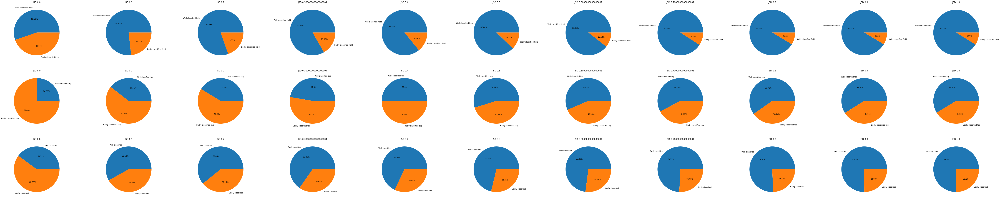

************************************************************************************************************************


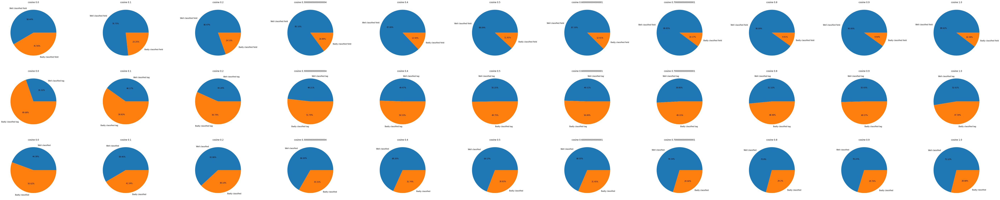

************************************************************************************************************************


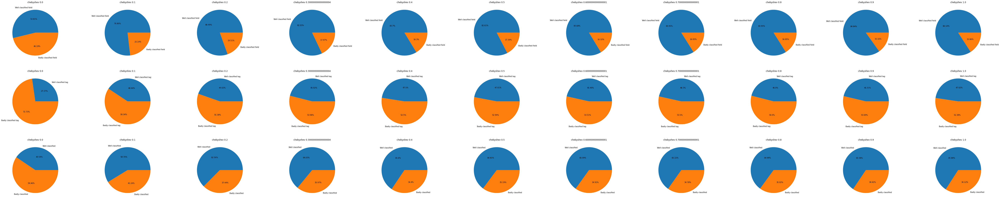

************************************************************************************************************************


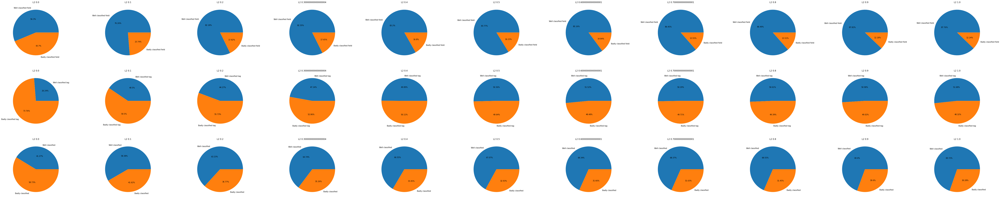

************************************************************************************************************************


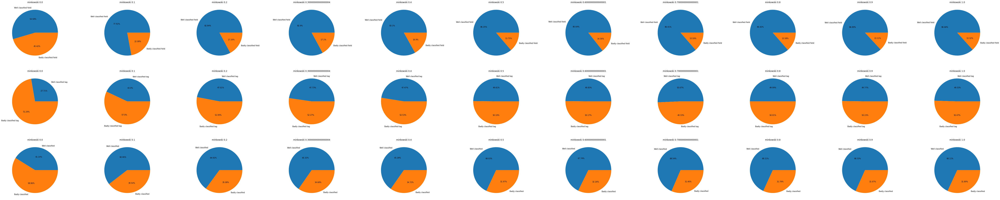

************************************************************************************************************************


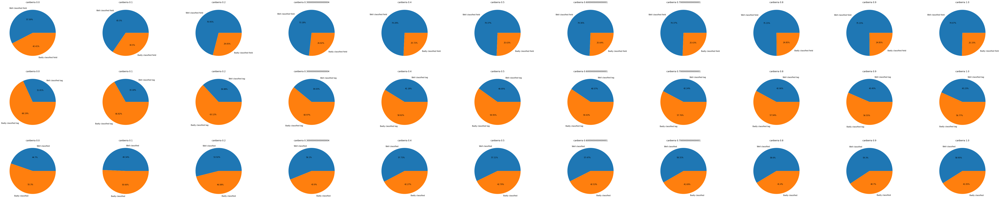

************************************************************************************************************************


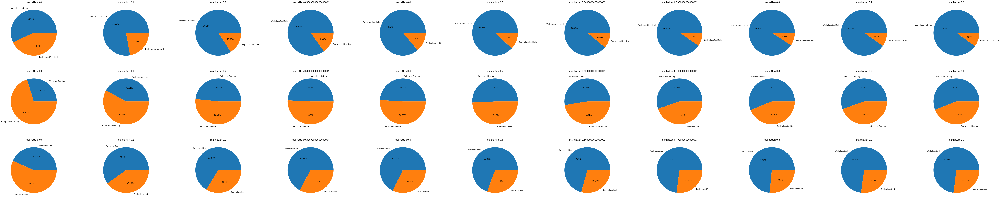

************************************************************************************************************************


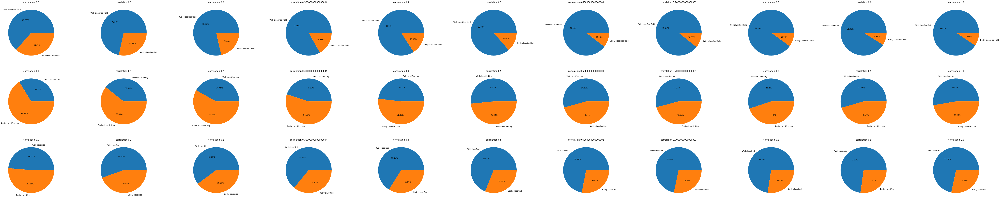

************************************************************************************************************************


In [32]:
for measure in measures:
    
    # create a figure with two subplots
    fig, ax = plt.subplots(3,11, figsize=(100, 20))
    
    # plot each pie chart in a separate subplot
    for j, weight in enumerate(np.linspace(0,1,11)):
        ax[0][j].pie(classified_field_pie[measure][j], labels = ["Well classified field","Badly classified field"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[0][j].set_title(measure + " " + str(weight))
        ax[1][j].pie(classified_tag_pie[measure][j], labels = ["Well classified tag","Badly classified tag"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[1][j].set_title(measure + " " + str(weight))
        ax[2][j].pie([field+tag for field,tag in zip(classified_field_pie[measure][j],classified_tag_pie[measure][j])], labels = ["Well classified","Badly classified"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[2][j].set_title(measure + " " + str(weight))
    plt.show()
    print(120*"*")

In [12]:
field2, tag2 = similarity.evaluation2(data_eval, measures)

JSD
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
cosine
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
chebyshev
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
L2
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
minkowski
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
canberra
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
manhattan
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0
correlation
0.0
0.1
0.2
0.30000000000000004
0.4
0.5
0.6000000000000001
0.7000000000000001
0.8
0.9
1.0


In [13]:
classified_field_pie = {measure : [] for measure in measures}
classified_tag_pie = {measure : [] for measure in measures}
for f, t, measure in zip(field2.values(), tag2.values(), measures):
    print(measure)
    for weight in np.linspace(0,1,11):
        sub_field = f[f["Weight"]==weight]
        sub_tag = t[t["Weight"]==weight]
        display(sub_field.style.background_gradient(cmap="Reds"))
        display(sub_tag.style.background_gradient(cmap="Reds"))
        classified_field_pie[measure].append([sub_field['Well classified field'].sum(axis=0),sub_field['Badly classified field'].sum(axis=0)])
        classified_tag_pie[measure].append([sub_tag['Well classified tag'].sum(axis=0),sub_tag['Badly classified tag'].sum(axis=0)])

JSD


,Well classified field,Badly classified field,Weight
physic,0.266477,0.733523,0.000000
biologie,0.297169,0.702831,0.000000
computer,0.285885,0.714115,0.000000
math,0.513120,0.486880,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.125000,0.875000,0.000000
biologie,0.250000,0.750000,0.000000
computer,0.191489,0.808511,0.000000
math,0.415929,0.584071,0.000000


,Well classified field,Badly classified field,Weight
physic,0.292309,0.707691,0.100000
biologie,0.373547,0.626453,0.100000
computer,0.317910,0.682090,0.100000
math,0.645790,0.354210,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.100000
biologie,0.423077,0.576923,0.100000
computer,0.234043,0.765957,0.100000
math,0.539823,0.460177,0.100000


,Well classified field,Badly classified field,Weight
physic,0.318071,0.681929,0.200000
biologie,0.412471,0.587529,0.200000
computer,0.370871,0.629129,0.200000
math,0.760525,0.239475,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.200000
biologie,0.413462,0.586538,0.200000
computer,0.255319,0.744681,0.200000
math,0.566372,0.433628,0.200000


,Well classified field,Badly classified field,Weight
physic,0.368760,0.631240,0.300000
biologie,0.431796,0.568204,0.300000
computer,0.403010,0.596990,0.300000
math,0.848864,0.151136,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.458333,0.541667,0.300000
biologie,0.480769,0.519231,0.300000
computer,0.351064,0.648936,0.300000
math,0.601770,0.398230,0.300000


,Well classified field,Badly classified field,Weight
physic,0.386186,0.613814,0.400000
biologie,0.451304,0.548696,0.400000
computer,0.455975,0.544025,0.400000
math,0.919736,0.080264,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.458333,0.541667,0.400000
biologie,0.548077,0.451923,0.400000
computer,0.382979,0.617021,0.400000
math,0.610619,0.389381,0.400000


,Well classified field,Badly classified field,Weight
physic,0.411461,0.588539,0.500000
biologie,0.489580,0.510420,0.500000
computer,0.487557,0.512443,0.500000
math,0.972908,0.027092,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.441667,0.558333,0.500000
biologie,0.615385,0.384615,0.500000
computer,0.436170,0.563830,0.500000
math,0.699115,0.300885,0.500000


,Well classified field,Badly classified field,Weight
physic,0.419863,0.580137,0.600000
biologie,0.518427,0.481573,0.600000
computer,0.487783,0.512217,0.600000
math,0.973063,0.026937,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.458333,0.541667,0.600000
biologie,0.634615,0.365385,0.600000
computer,0.446809,0.553191,0.600000
math,0.716814,0.283186,0.600000


,Well classified field,Badly classified field,Weight
physic,0.419933,0.580067,0.700000
biologie,0.546997,0.453003,0.700000
computer,0.477370,0.522630,0.700000
math,0.982068,0.017932,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.458333,0.541667,0.700000
biologie,0.644231,0.355769,0.700000
computer,0.489362,0.510638,0.700000
math,0.716814,0.283186,0.700000


,Well classified field,Badly classified field,Weight
physic,0.403543,0.596457,0.800000
biologie,0.556795,0.443205,0.800000
computer,0.508947,0.491053,0.800000
math,0.981990,0.018010,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.450000,0.550000,0.800000
biologie,0.682692,0.317308,0.800000
computer,0.521277,0.478723,0.800000
math,0.734513,0.265487,0.800000


,Well classified field,Badly classified field,Weight
physic,0.411806,0.588194,0.900000
biologie,0.566411,0.433589,0.900000
computer,0.509059,0.490941,0.900000
math,0.973296,0.026704,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.466667,0.533333,0.900000
biologie,0.663462,0.336538,0.900000
computer,0.500000,0.500000,0.900000
math,0.725664,0.274336,0.900000


,Well classified field,Badly classified field,Weight
physic,0.395347,0.604653,1.000000
biologie,0.556889,0.443111,1.000000
computer,0.508947,0.491053,1.000000
math,0.973296,0.026704,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.466667,0.533333,1.000000
biologie,0.682692,0.317308,1.000000
computer,0.489362,0.510638,1.000000
math,0.707965,0.292035,1.000000


cosine


,Well classified field,Badly classified field,Weight
physic,0.324808,0.675192,0.000000
biologie,0.325925,0.674075,0.000000
computer,0.328663,0.671337,0.000000
math,0.424780,0.575220,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.133333,0.866667,0.000000
biologie,0.346154,0.653846,0.000000
computer,0.255319,0.744681,0.000000
math,0.477876,0.522124,0.000000


,Well classified field,Badly classified field,Weight
physic,0.342513,0.657487,0.100000
biologie,0.364486,0.635514,0.100000
computer,0.371324,0.628676,0.100000
math,0.627931,0.372069,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.350000,0.650000,0.100000
biologie,0.461538,0.538462,0.100000
computer,0.308511,0.691489,0.100000
math,0.486726,0.513274,0.100000


,Well classified field,Badly classified field,Weight
physic,0.368344,0.631656,0.200000
biologie,0.374658,0.625342,0.200000
computer,0.392821,0.607179,0.200000
math,0.760444,0.239556,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.200000
biologie,0.461538,0.538462,0.200000
computer,0.372340,0.627660,0.200000
math,0.513274,0.486726,0.200000


,Well classified field,Badly classified field,Weight
physic,0.386049,0.613951,0.300000
biologie,0.422920,0.577080,0.300000
computer,0.445673,0.554327,0.300000
math,0.857789,0.142211,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.375000,0.625000,0.300000
biologie,0.538462,0.461538,0.300000
computer,0.457447,0.542553,0.300000
math,0.557522,0.442478,0.300000


,Well classified field,Badly classified field,Weight
physic,0.403267,0.596733,0.400000
biologie,0.432722,0.567278,0.400000
computer,0.445898,0.554102,0.400000
math,0.920046,0.079954,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.400000
biologie,0.538462,0.461538,0.400000
computer,0.457447,0.542553,0.400000
math,0.566372,0.433628,0.400000


,Well classified field,Badly classified field,Weight
physic,0.411807,0.588193,0.500000
biologie,0.480706,0.519294,0.500000
computer,0.466953,0.533047,0.500000
math,0.955597,0.044403,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.500000
biologie,0.548077,0.451923,0.500000
computer,0.478723,0.521277,0.500000
math,0.566372,0.433628,0.500000


,Well classified field,Badly classified field,Weight
physic,0.412014,0.587986,0.600000
biologie,0.500028,0.499972,0.600000
computer,0.467290,0.532710,0.600000
math,0.955752,0.044248,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.425000,0.575000,0.600000
biologie,0.538462,0.461538,0.600000
computer,0.468085,0.531915,0.600000
math,0.548673,0.451327,0.600000


,Well classified field,Badly classified field,Weight
physic,0.428542,0.571458,0.700000
biologie,0.509644,0.490356,0.700000
computer,0.467295,0.532705,0.700000
math,0.955907,0.044093,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.700000
biologie,0.605769,0.394231,0.700000
computer,0.489362,0.510638,0.700000
math,0.522124,0.477876,0.700000


,Well classified field,Badly classified field,Weight
physic,0.428542,0.571458,0.800000
biologie,0.528780,0.471220,0.800000
computer,0.467409,0.532591,0.800000
math,0.964756,0.035244,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.400000,0.600000,0.800000
biologie,0.596154,0.403846,0.800000
computer,0.489362,0.510638,0.800000
math,0.575221,0.424779,0.800000


,Well classified field,Badly classified field,Weight
physic,0.403749,0.596251,0.900000
biologie,0.528963,0.471037,0.900000
computer,0.446359,0.553641,0.900000
math,0.964756,0.035244,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.358333,0.641667,0.900000
biologie,0.615385,0.384615,0.900000
computer,0.468085,0.531915,0.900000
math,0.575221,0.424779,0.900000


,Well classified field,Badly classified field,Weight
physic,0.403818,0.596182,1.000000
biologie,0.538669,0.461331,1.000000
computer,0.446134,0.553866,1.000000
math,0.955907,0.044093,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.375000,0.625000,1.000000
biologie,0.615385,0.384615,1.000000
computer,0.468085,0.531915,1.000000
math,0.646018,0.353982,1.000000


chebyshev


,Well classified field,Badly classified field,Weight
physic,0.374999,0.625001,0.000000
biologie,0.135368,0.864632,0.000000
computer,0.360795,0.639205,0.000000
math,0.221865,0.778135,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.175000,0.825000,0.000000
biologie,0.317308,0.682692,0.000000
computer,0.191489,0.808511,0.000000
math,0.407080,0.592920,0.000000


,Well classified field,Badly classified field,Weight
physic,0.425355,0.574645,0.100000
biologie,0.307351,0.692649,0.100000
computer,0.414104,0.585896,0.100000
math,0.659367,0.340633,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.308333,0.691667,0.100000
biologie,0.432692,0.567308,0.100000
computer,0.319149,0.680851,0.100000
math,0.566372,0.433628,0.100000


,Well classified field,Badly classified field,Weight
physic,0.360071,0.639929,0.200000
biologie,0.355520,0.644480,0.200000
computer,0.393172,0.606828,0.200000
math,0.817110,0.182890,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.316667,0.683333,0.200000
biologie,0.471154,0.528846,0.200000
computer,0.404255,0.595745,0.200000
math,0.592920,0.407080,0.200000


,Well classified field,Badly classified field,Weight
physic,0.310902,0.689098,0.300000
biologie,0.403778,0.596222,0.300000
computer,0.393173,0.606827,0.300000
math,0.878746,0.121254,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.341667,0.658333,0.300000
biologie,0.480769,0.519231,0.300000
computer,0.425532,0.574468,0.300000
math,0.592920,0.407080,0.300000


,Well classified field,Badly classified field,Weight
physic,0.302984,0.697016,0.400000
biologie,0.441965,0.558035,0.400000
computer,0.404259,0.595741,0.400000
math,0.914066,0.085934,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.400000
biologie,0.519231,0.480769,0.400000
computer,0.414894,0.585106,0.400000
math,0.557522,0.442478,0.400000


,Well classified field,Badly classified field,Weight
physic,0.311525,0.688475,0.500000
biologie,0.461104,0.538896,0.500000
computer,0.414785,0.585215,0.500000
math,0.940459,0.059541,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.500000
biologie,0.519231,0.480769,0.500000
computer,0.404255,0.595745,0.500000
math,0.548673,0.451327,0.500000


,Well classified field,Badly classified field,Weight
physic,0.311664,0.688336,0.600000
biologie,0.490224,0.509776,0.600000
computer,0.436059,0.563941,0.600000
math,0.931687,0.068313,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.358333,0.641667,0.600000
biologie,0.528846,0.471154,0.600000
computer,0.414894,0.585106,0.600000
math,0.557522,0.442478,0.600000


,Well classified field,Badly classified field,Weight
physic,0.303538,0.696462,0.700000
biologie,0.556977,0.443023,0.700000
computer,0.446806,0.553194,0.700000
math,0.931766,0.068234,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.350000,0.650000,0.700000
biologie,0.528846,0.471154,0.700000
computer,0.414894,0.585106,0.700000
math,0.566372,0.433628,0.700000


,Well classified field,Badly classified field,Weight
physic,0.295412,0.704588,0.800000
biologie,0.576114,0.423886,0.800000
computer,0.446918,0.553082,0.800000
math,0.931765,0.068235,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.333333,0.666667,0.800000
biologie,0.509615,0.490385,0.800000
computer,0.404255,0.595745,0.800000
math,0.592920,0.407080,0.800000


,Well classified field,Badly classified field,Weight
physic,0.287354,0.712646,0.900000
biologie,0.576208,0.423792,0.900000
computer,0.446580,0.553420,0.900000
math,0.931843,0.068157,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.333333,0.666667,0.900000
biologie,0.528846,0.471154,0.900000
computer,0.414894,0.585106,0.900000
math,0.575221,0.424779,0.900000


,Well classified field,Badly classified field,Weight
physic,0.279021,0.720979,1.000000
biologie,0.557161,0.442839,1.000000
computer,0.446356,0.553644,1.000000
math,0.940614,0.059386,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.325000,0.675000,1.000000
biologie,0.538462,0.461538,1.000000
computer,0.457447,0.542553,1.000000
math,0.584071,0.415929,1.000000


L2


,Well classified field,Badly classified field,Weight
physic,0.324804,0.675196,0.000000
biologie,0.249734,0.750266,0.000000
computer,0.286220,0.713780,0.000000
math,0.389693,0.610307,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.141667,0.858333,0.000000
biologie,0.240385,0.759615,0.000000
computer,0.234043,0.765957,0.000000
math,0.433628,0.566372,0.000000


,Well classified field,Badly classified field,Weight
physic,0.417509,0.582491,0.100000
biologie,0.383899,0.616101,0.100000
computer,0.350609,0.649391,0.100000
math,0.696709,0.303291,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.358333,0.641667,0.100000
biologie,0.413462,0.586538,0.100000
computer,0.308511,0.691489,0.100000
math,0.539823,0.460177,0.100000


,Well classified field,Badly classified field,Weight
physic,0.385215,0.614785,0.200000
biologie,0.422734,0.577266,0.200000
computer,0.371886,0.628114,0.200000
math,0.819751,0.180249,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.200000
biologie,0.480769,0.519231,0.200000
computer,0.340426,0.659574,0.200000
math,0.566372,0.433628,0.200000


,Well classified field,Badly classified field,Weight
physic,0.360910,0.639090,0.300000
biologie,0.471272,0.528728,0.300000
computer,0.424742,0.575258,0.300000
math,0.872538,0.127462,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.391667,0.608333,0.300000
biologie,0.548077,0.451923,0.300000
computer,0.361702,0.638298,0.300000
math,0.584071,0.415929,0.300000


,Well classified field,Badly classified field,Weight
physic,0.320212,0.679788,0.400000
biologie,0.462210,0.537790,0.400000
computer,0.435603,0.564397,0.400000
math,0.925090,0.074910,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.400000
biologie,0.615385,0.384615,0.400000
computer,0.361702,0.638298,0.400000
math,0.601770,0.398230,0.400000


,Well classified field,Badly classified field,Weight
physic,0.287225,0.712775,0.500000
biologie,0.491147,0.508853,0.500000
computer,0.435943,0.564057,0.500000
math,0.933706,0.066294,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.500000
biologie,0.644231,0.355769,0.500000
computer,0.351064,0.648936,0.500000
math,0.610619,0.389381,0.500000


,Well classified field,Badly classified field,Weight
physic,0.270834,0.729166,0.600000
biologie,0.519900,0.480100,0.600000
computer,0.415007,0.584993,0.600000
math,0.933706,0.066294,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.425000,0.575000,0.600000
biologie,0.663462,0.336538,0.600000
computer,0.361702,0.638298,0.600000
math,0.610619,0.389381,0.600000


,Well classified field,Badly classified field,Weight
physic,0.221389,0.778611,0.700000
biologie,0.529516,0.470484,0.700000
computer,0.425536,0.574464,0.700000
math,0.933785,0.066215,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.700000
biologie,0.634615,0.365385,0.700000
computer,0.382979,0.617021,0.700000
math,0.610619,0.389381,0.700000


,Well classified field,Badly classified field,Weight
physic,0.205068,0.794932,0.800000
biologie,0.529606,0.470394,0.800000
computer,0.436062,0.563938,0.800000
math,0.933785,0.066215,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.350000,0.650000,0.800000
biologie,0.615385,0.384615,0.800000
computer,0.404255,0.595745,0.800000
math,0.654867,0.345133,0.800000


,Well classified field,Badly classified field,Weight
physic,0.204999,0.795001,0.900000
biologie,0.529698,0.470302,0.900000
computer,0.425425,0.574575,0.900000
math,0.933862,0.066138,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.366667,0.633333,0.900000
biologie,0.615385,0.384615,0.900000
computer,0.393617,0.606383,0.900000
math,0.663717,0.336283,0.900000


,Well classified field,Badly classified field,Weight
physic,0.204998,0.795002,1.000000
biologie,0.539311,0.460689,1.000000
computer,0.435949,0.564051,1.000000
math,0.933785,0.066215,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,1.000000
biologie,0.644231,0.355769,1.000000
computer,0.393617,0.606383,1.000000
math,0.646018,0.353982,1.000000


minkowski


,Well classified field,Badly classified field,Weight
physic,0.382993,0.617007,0.000000
biologie,0.221072,0.778928,0.000000
computer,0.339295,0.660705,0.000000
math,0.292662,0.707338,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.166667,0.833333,0.000000
biologie,0.307692,0.692308,0.000000
computer,0.191489,0.808511,0.000000
math,0.442478,0.557522,0.000000


,Well classified field,Badly classified field,Weight
physic,0.400980,0.599020,0.100000
biologie,0.317237,0.682763,0.100000
computer,0.371774,0.628226,0.100000
math,0.677924,0.322076,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.350000,0.650000,0.100000
biologie,0.480769,0.519231,0.100000
computer,0.340426,0.659574,0.100000
math,0.548673,0.451327,0.100000


,Well classified field,Badly classified field,Weight
physic,0.360077,0.639923,0.200000
biologie,0.403596,0.596404,0.200000
computer,0.403577,0.596423,0.200000
math,0.818042,0.181958,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.375000,0.625000,0.200000
biologie,0.490385,0.509615,0.200000
computer,0.404255,0.595745,0.200000
math,0.610619,0.389381,0.200000


,Well classified field,Badly classified field,Weight
physic,0.311118,0.688882,0.300000
biologie,0.452224,0.547776,0.300000
computer,0.404140,0.595860,0.300000
math,0.879524,0.120476,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.375000,0.625000,0.300000
biologie,0.519231,0.480769,0.300000
computer,0.404255,0.595745,0.300000
math,0.610619,0.389381,0.300000


,Well classified field,Badly classified field,Weight
physic,0.303337,0.696663,0.400000
biologie,0.471822,0.528178,0.400000
computer,0.404257,0.595743,0.400000
math,0.914688,0.085312,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.391667,0.608333,0.400000
biologie,0.557692,0.442308,0.400000
computer,0.382979,0.617021,0.400000
math,0.566372,0.433628,0.400000


,Well classified field,Badly classified field,Weight
physic,0.270351,0.729649,0.500000
biologie,0.490961,0.509039,0.500000
computer,0.394069,0.605931,0.500000
math,0.932464,0.067536,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.500000
biologie,0.615385,0.384615,0.500000
computer,0.393617,0.606383,0.500000
math,0.575221,0.424779,0.500000


,Well classified field,Badly classified field,Weight
physic,0.254098,0.745902,0.600000
biologie,0.538852,0.461148,0.600000
computer,0.404372,0.595628,0.600000
math,0.932386,0.067614,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.391667,0.608333,0.600000
biologie,0.634615,0.365385,0.600000
computer,0.382979,0.617021,0.600000
math,0.584071,0.415929,0.600000


,Well classified field,Badly classified field,Weight
physic,0.237640,0.762360,0.700000
biologie,0.538852,0.461148,0.700000
computer,0.425312,0.574688,0.700000
math,0.932386,0.067614,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.700000
biologie,0.625000,0.375000,0.700000
computer,0.425532,0.574468,0.700000
math,0.592920,0.407080,0.700000


,Well classified field,Badly classified field,Weight
physic,0.229583,0.770417,0.800000
biologie,0.539035,0.460965,0.800000
computer,0.425536,0.574464,0.800000
math,0.932541,0.067459,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.358333,0.641667,0.800000
biologie,0.576923,0.423077,0.800000
computer,0.436170,0.563830,0.800000
math,0.628319,0.371681,0.800000


,Well classified field,Badly classified field,Weight
physic,0.213124,0.786876,0.900000
biologie,0.548649,0.451351,0.900000
computer,0.436175,0.563825,0.900000
math,0.932541,0.067459,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.358333,0.641667,0.900000
biologie,0.576923,0.423077,0.900000
computer,0.436170,0.563830,0.900000
math,0.619469,0.380531,0.900000


,Well classified field,Badly classified field,Weight
physic,0.221388,0.778612,1.000000
biologie,0.567788,0.432212,1.000000
computer,0.446699,0.553301,1.000000
math,0.932542,0.067458,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.358333,0.641667,1.000000
biologie,0.567308,0.432692,1.000000
computer,0.436170,0.563830,1.000000
math,0.619469,0.380531,1.000000


canberra


,Well classified field,Badly classified field,Weight
physic,0.208421,0.791579,0.000000
biologie,0.345797,0.654203,0.000000
computer,0.244915,0.755085,0.000000
math,0.601623,0.398377,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.158333,0.841667,0.000000
biologie,0.269231,0.730769,0.000000
computer,0.234043,0.765957,0.000000
math,0.610619,0.389381,0.000000


,Well classified field,Badly classified field,Weight
physic,0.216965,0.783035,0.100000
biologie,0.346080,0.653920,0.100000
computer,0.287347,0.712653,0.100000
math,0.628485,0.371515,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.216667,0.783333,0.100000
biologie,0.250000,0.750000,0.100000
computer,0.223404,0.776596,0.100000
math,0.637168,0.362832,0.100000


,Well classified field,Badly classified field,Weight
physic,0.258562,0.741438,0.200000
biologie,0.336466,0.663534,0.200000
computer,0.350498,0.649502,0.200000
math,0.682122,0.317878,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.266667,0.733333,0.200000
biologie,0.278846,0.721154,0.200000
computer,0.265957,0.734043,0.200000
math,0.663717,0.336283,0.200000


,Well classified field,Badly classified field,Weight
physic,0.292029,0.707971,0.300000
biologie,0.355421,0.644579,0.300000
computer,0.371774,0.628226,0.300000
math,0.734984,0.265016,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.341667,0.658333,0.300000
biologie,0.307692,0.692308,0.300000
computer,0.265957,0.734043,0.300000
math,0.646018,0.353982,0.300000


,Well classified field,Badly classified field,Weight
physic,0.300638,0.699362,0.400000
biologie,0.355327,0.644673,0.400000
computer,0.402899,0.597101,0.400000
math,0.744068,0.255932,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.366667,0.633333,0.400000
biologie,0.317308,0.682692,0.400000
computer,0.255319,0.744681,0.400000
math,0.707965,0.292035,0.400000


,Well classified field,Badly classified field,Weight
physic,0.333832,0.666168,0.500000
biologie,0.355235,0.644765,0.500000
computer,0.402895,0.597105,0.500000
math,0.787847,0.212153,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.366667,0.633333,0.500000
biologie,0.326923,0.673077,0.500000
computer,0.244681,0.755319,0.500000
math,0.663717,0.336283,0.500000


,Well classified field,Badly classified field,Weight
physic,0.358692,0.641308,0.600000
biologie,0.393323,0.606677,0.600000
computer,0.402670,0.597330,0.600000
math,0.814083,0.185917,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.375000,0.625000,0.600000
biologie,0.375000,0.625000,0.600000
computer,0.244681,0.755319,0.600000
math,0.628319,0.371681,0.600000


,Well classified field,Badly classified field,Weight
physic,0.358760,0.641240,0.700000
biologie,0.412550,0.587450,0.700000
computer,0.402556,0.597444,0.700000
math,0.778920,0.221080,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.700000
biologie,0.413462,0.586538,0.700000
computer,0.265957,0.734043,0.700000
math,0.601770,0.398230,0.700000


,Well classified field,Badly classified field,Weight
physic,0.350565,0.649435,0.800000
biologie,0.393592,0.606408,0.800000
computer,0.402553,0.597447,0.800000
math,0.681971,0.318029,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.383333,0.616667,0.800000
biologie,0.413462,0.586538,0.800000
computer,0.265957,0.734043,0.800000
math,0.619469,0.380531,0.800000


,Well classified field,Badly classified field,Weight
physic,0.375287,0.624713,0.900000
biologie,0.384159,0.615841,0.900000
computer,0.423492,0.576508,0.900000
math,0.628953,0.371047,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.391667,0.608333,0.900000
biologie,0.432692,0.567308,0.900000
computer,0.276596,0.723404,0.900000
math,0.637168,0.362832,0.900000


,Well classified field,Badly classified field,Weight
physic,0.375424,0.624576,1.000000
biologie,0.374818,0.625182,1.000000
computer,0.434019,0.565981,1.000000
math,0.602560,0.397440,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.391667,0.608333,1.000000
biologie,0.432692,0.567308,1.000000
computer,0.276596,0.723404,1.000000
math,0.628319,0.371681,1.000000


manhattan


,Well classified field,Badly classified field,Weight
physic,0.249743,0.750257,0.000000
biologie,0.345431,0.654569,0.000000
computer,0.222845,0.777155,0.000000
math,0.557137,0.442863,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.158333,0.841667,0.000000
biologie,0.326923,0.673077,0.000000
computer,0.234043,0.765957,0.000000
math,0.469027,0.530973,0.000000


,Well classified field,Badly classified field,Weight
physic,0.275509,0.724491,0.100000
biologie,0.402855,0.597145,0.100000
computer,0.328549,0.671451,0.100000
math,0.698809,0.301191,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.366667,0.633333,0.100000
biologie,0.423077,0.576923,0.100000
computer,0.297872,0.702128,0.100000
math,0.592920,0.407080,0.100000


,Well classified field,Badly classified field,Weight
physic,0.284812,0.715188,0.200000
biologie,0.432164,0.567836,0.200000
computer,0.339859,0.660141,0.200000
math,0.831242,0.168758,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.200000
biologie,0.500000,0.500000,0.200000
computer,0.361702,0.638298,0.200000
math,0.663717,0.336283,0.200000


,Well classified field,Badly classified field,Weight
physic,0.302444,0.697556,0.300000
biologie,0.451579,0.548421,0.300000
computer,0.413875,0.586125,0.300000
math,0.884574,0.115426,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.441667,0.558333,0.300000
biologie,0.519231,0.480769,0.300000
computer,0.382979,0.617021,0.300000
math,0.628319,0.371681,0.300000


,Well classified field,Badly classified field,Weight
physic,0.353129,0.646871,0.400000
biologie,0.480334,0.519666,0.400000
computer,0.456315,0.543685,0.400000
math,0.946517,0.053483,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.433333,0.566667,0.400000
biologie,0.567308,0.432692,0.400000
computer,0.414894,0.585106,0.400000
math,0.548673,0.451327,0.400000


,Well classified field,Badly classified field,Weight
physic,0.361808,0.638192,0.500000
biologie,0.461198,0.538802,0.500000
computer,0.467068,0.532932,0.500000
math,0.973141,0.026859,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.425000,0.575000,0.500000
biologie,0.596154,0.403846,0.500000
computer,0.436170,0.563830,0.500000
math,0.575221,0.424779,0.500000


,Well classified field,Badly classified field,Weight
physic,0.395209,0.604791,0.600000
biologie,0.480427,0.519573,0.600000
computer,0.488341,0.511659,0.600000
math,0.973219,0.026781,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.600000
biologie,0.605769,0.394231,0.600000
computer,0.478723,0.521277,0.600000
math,0.610619,0.389381,0.600000


,Well classified field,Badly classified field,Weight
physic,0.395347,0.604653,0.700000
biologie,0.490041,0.509959,0.700000
computer,0.509391,0.490609,0.700000
math,0.973142,0.026858,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.433333,0.566667,0.700000
biologie,0.644231,0.355769,0.700000
computer,0.468085,0.531915,0.700000
math,0.663717,0.336283,0.700000


,Well classified field,Badly classified field,Weight
physic,0.370624,0.629376,0.800000
biologie,0.499565,0.500435,0.800000
computer,0.488117,0.511883,0.800000
math,0.973064,0.026936,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.441667,0.558333,0.800000
biologie,0.644231,0.355769,0.800000
computer,0.478723,0.521277,0.800000
math,0.681416,0.318584,0.800000


,Well classified field,Badly classified field,Weight
physic,0.345763,0.654237,0.900000
biologie,0.509363,0.490637,0.900000
computer,0.477481,0.522519,0.900000
math,0.973063,0.026937,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.441667,0.558333,0.900000
biologie,0.634615,0.365385,0.900000
computer,0.478723,0.521277,0.900000
math,0.663717,0.336283,0.900000


,Well classified field,Badly classified field,Weight
physic,0.329236,0.670764,1.000000
biologie,0.518886,0.481114,1.000000
computer,0.509168,0.490832,1.000000
math,0.964214,0.035786,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.458333,0.541667,1.000000
biologie,0.634615,0.365385,1.000000
computer,0.489362,0.510638,1.000000
math,0.654867,0.345133,1.000000


correlation


,Well classified field,Badly classified field,Weight
physic,0.307523,0.692477,0.000000
biologie,0.383439,0.616561,0.000000
computer,0.445787,0.554213,0.000000
math,0.460100,0.539900,0.000000


,Well classified tag,Badly classified tag,Weight
physic,0.191667,0.808333,0.000000
biologie,0.384615,0.615385,0.000000
computer,0.276596,0.723404,0.000000
math,0.495575,0.504425,0.000000


,Well classified field,Badly classified field,Weight
physic,0.308217,0.691783,0.100000
biologie,0.412287,0.587713,0.100000
computer,0.435711,0.564289,0.100000
math,0.627468,0.372532,0.100000


,Well classified tag,Badly classified tag,Weight
physic,0.241667,0.758333,0.100000
biologie,0.432692,0.567308,0.100000
computer,0.340426,0.659574,0.100000
math,0.557522,0.442478,0.100000


,Well classified field,Badly classified field,Weight
physic,0.301196,0.698804,0.200000
biologie,0.412844,0.587156,0.200000
computer,0.446125,0.553875,0.200000
math,0.778143,0.221857,0.200000


,Well classified tag,Badly classified tag,Weight
physic,0.291667,0.708333,0.200000
biologie,0.423077,0.576923,0.200000
computer,0.393617,0.606383,0.200000
math,0.566372,0.433628,0.200000


,Well classified field,Badly classified field,Weight
physic,0.335703,0.664297,0.300000
biologie,0.432170,0.567830,0.300000
computer,0.435487,0.564513,0.300000
math,0.893344,0.106656,0.300000


,Well classified tag,Badly classified tag,Weight
physic,0.316667,0.683333,0.300000
biologie,0.461538,0.538462,0.300000
computer,0.446809,0.553191,0.300000
math,0.575221,0.424779,0.300000


,Well classified field,Badly classified field,Weight
physic,0.353336,0.646664,0.400000
biologie,0.461016,0.538984,0.400000
computer,0.466839,0.533161,0.400000
math,0.955441,0.044559,0.400000


,Well classified tag,Badly classified tag,Weight
physic,0.333333,0.666667,0.400000
biologie,0.528846,0.471154,0.400000
computer,0.478723,0.521277,0.400000
math,0.584071,0.415929,0.400000


,Well classified field,Badly classified field,Weight
physic,0.337361,0.662639,0.500000
biologie,0.518521,0.481479,0.500000
computer,0.477817,0.522183,0.500000
math,0.964600,0.035400,0.500000


,Well classified tag,Badly classified tag,Weight
physic,0.358333,0.641667,0.500000
biologie,0.596154,0.403846,0.500000
computer,0.489362,0.510638,0.500000
math,0.619469,0.380531,0.500000


,Well classified field,Badly classified field,Weight
physic,0.337429,0.662571,0.600000
biologie,0.499660,0.500340,0.600000
computer,0.477929,0.522071,0.600000
math,0.964678,0.035322,0.600000


,Well classified tag,Badly classified tag,Weight
physic,0.400000,0.600000,0.600000
biologie,0.634615,0.365385,0.600000
computer,0.500000,0.500000,0.600000
math,0.637168,0.362832,0.600000


,Well classified field,Badly classified field,Weight
physic,0.387151,0.612849,0.700000
biologie,0.518982,0.481018,0.700000
computer,0.477708,0.522292,0.700000
math,0.964756,0.035244,0.700000


,Well classified tag,Badly classified tag,Weight
physic,0.408333,0.591667,0.700000
biologie,0.634615,0.365385,0.700000
computer,0.510638,0.489362,0.700000
math,0.610619,0.389381,0.700000


,Well classified field,Badly classified field,Weight
physic,0.445069,0.554931,0.800000
biologie,0.528596,0.471404,0.800000
computer,0.467295,0.532705,0.800000
math,0.964756,0.035244,0.800000


,Well classified tag,Badly classified tag,Weight
physic,0.433333,0.566667,0.800000
biologie,0.644231,0.355769,0.800000
computer,0.489362,0.510638,0.800000
math,0.637168,0.362832,0.800000


,Well classified field,Badly classified field,Weight
physic,0.461597,0.538403,0.900000
biologie,0.519255,0.480745,0.900000
computer,0.456881,0.543119,0.900000
math,0.964756,0.035244,0.900000


,Well classified tag,Badly classified tag,Weight
physic,0.416667,0.583333,0.900000
biologie,0.644231,0.355769,0.900000
computer,0.489362,0.510638,0.900000
math,0.628319,0.371681,0.900000


,Well classified field,Badly classified field,Weight
physic,0.453402,0.546598,1.000000
biologie,0.529051,0.470949,1.000000
computer,0.425081,0.574919,1.000000
math,0.964756,0.035244,1.000000


,Well classified tag,Badly classified tag,Weight
physic,0.375000,0.625000,1.000000
biologie,0.625000,0.375000,1.000000
computer,0.478723,0.521277,1.000000
math,0.628319,0.371681,1.000000


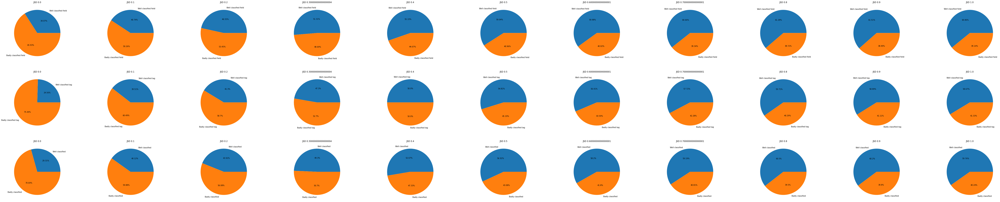

************************************************************************************************************************


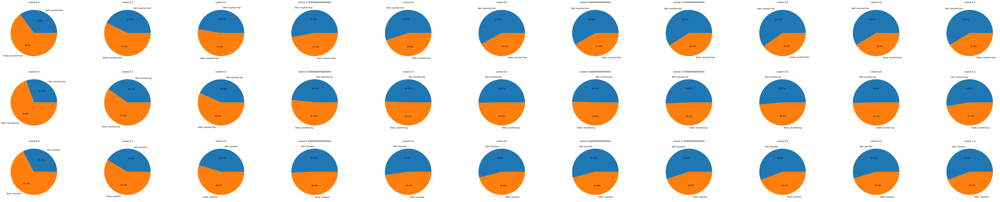

************************************************************************************************************************


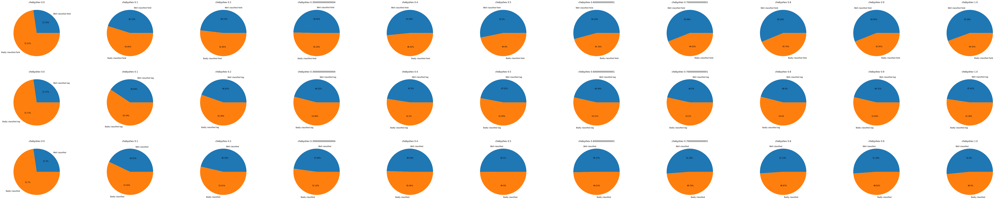

************************************************************************************************************************


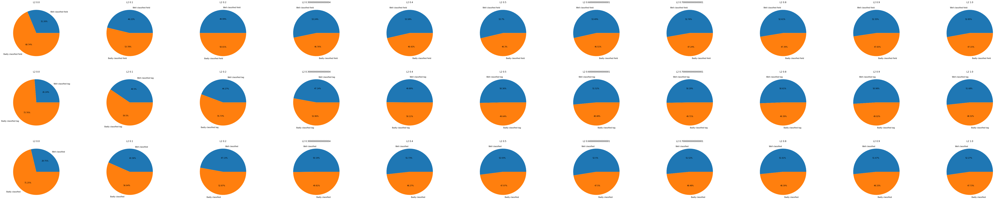

************************************************************************************************************************


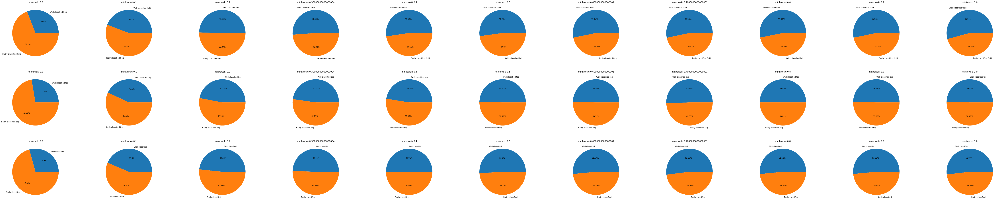

************************************************************************************************************************


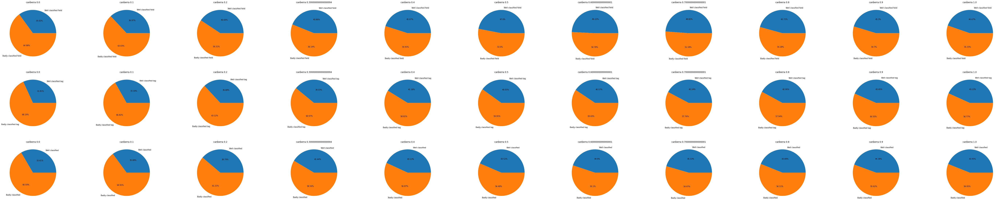

************************************************************************************************************************


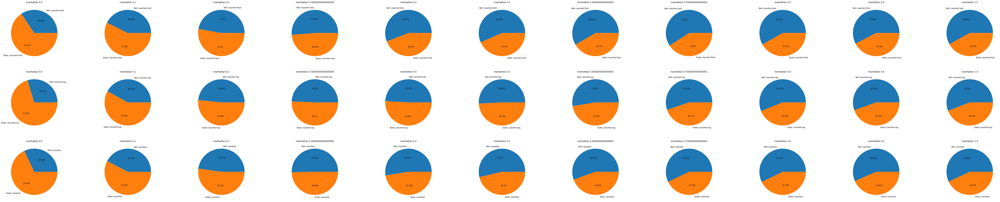

************************************************************************************************************************


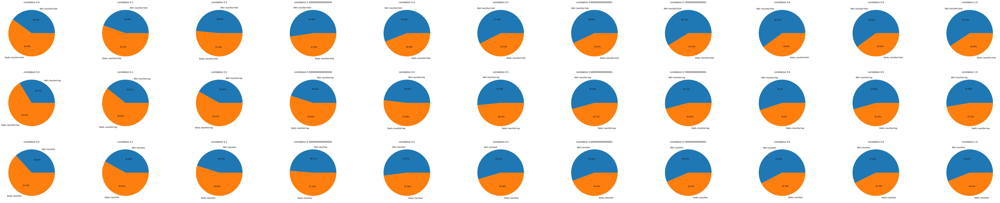

************************************************************************************************************************


In [14]:
for measure in measures:
    
    # create a figure with two subplots
    fig, ax = plt.subplots(3,11, figsize=(100, 20))
    
    # plot each pie chart in a separate subplot
    for j, weight in enumerate(np.linspace(0,1,11)):
        ax[0][j].pie(classified_field_pie[measure][j], labels = ["Well classified field","Badly classified field"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[0][j].set_title(measure + " " + str(weight))
        ax[1][j].pie(classified_tag_pie[measure][j], labels = ["Well classified tag","Badly classified tag"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[1][j].set_title(measure + " " + str(weight))
        ax[2][j].pie([field+tag for field,tag in zip(classified_field_pie[measure][j],classified_tag_pie[measure][j])], labels = ["Well classified","Badly classified"], normalize = True, autopct = lambda x: str(round(x, 2)) + '%')
        ax[2][j].set_title(measure + " " + str(weight))
    plt.show()
    print(120*"*")

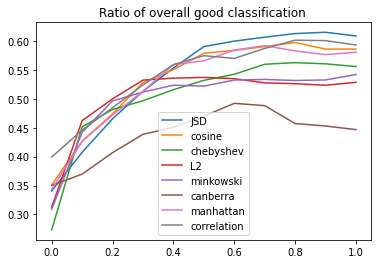

In [15]:
for measure in measures:
    temp = [(field[0] )/(field[0]  + field[1] ) for field,tag in zip(classified_field_pie[measure],classified_tag_pie[measure])]
    plt.plot(np.linspace(0,1,11),temp,label = measure)
plt.legend() 
plt.title("Ratio of overall good classification ")
plt.show()

In [16]:
best_measure = [(field[0] )/(field[0]  + field[1] ) for field,tag in zip(classified_field_pie["JSD"],classified_tag_pie["JSD"])]
best_measure

[0.3406627678133559,
 0.40738891644834313,
 0.46548458670532034,
 0.513107599933719,
 0.5533004103755124,
 0.5903764828403033,
 0.5997842001501257,
 0.6065920456300227,
 0.6128189110958858,
 0.6151428577699662,
 0.6086196326984329]

In [17]:
with open('Saved Data/best_measure1_V3', 'wb') as f:
    pickle.dump(best_measure, f)

1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,

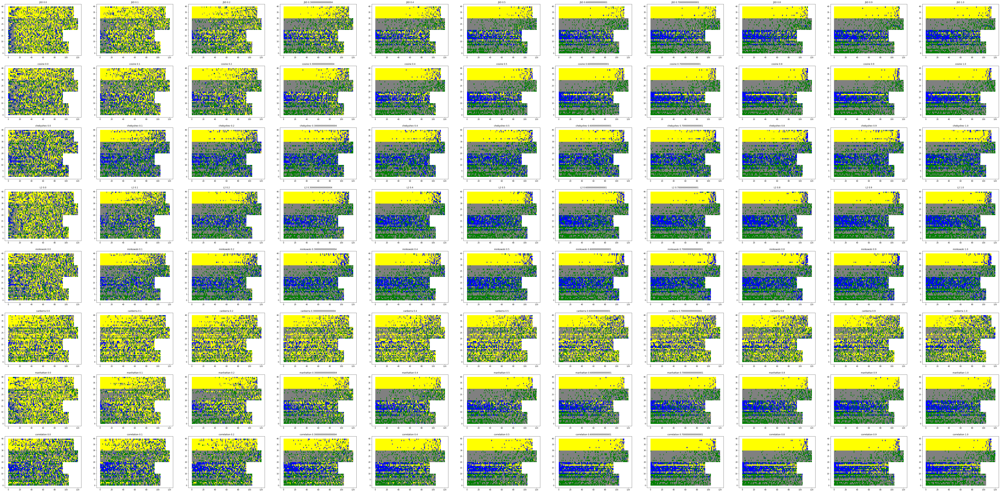

In [11]:
fig, ax = similarity.repartition_similarity(data_eval, measures)

In [ ]:
fig.savefig("Saved Data/repartition1_V3")